#**Project Goal**

**My Project seeks to understand what features make specific songs on spotify more popular than others**

The dataset is taken from a spotify dataset compiled and cleaned using Spotify's Web API and Python: https://www.kaggle.com/datasets/thedevastator/spotify-tracks-genre-dataset.


---


The latest release date among the most popular songs in the dataset  is September 22, 2022, so the approximate cutoff date for the dataset appears to be in late September 2022 or shortly thereafter.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import r2_score
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
import statsmodels.api as sm
import plotly.express as px
from scipy.stats import pearsonr
from scipy.stats import chi2_contingency
from IPython.display import display
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [ ]:
#df=pd.read_csv("train.csv")
df = pd.read_csv('https://raw.githubusercontent.com/jellyfishing2346/CISC-3225/refs/heads/main/train.csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

### **What each column means**

**Identifers**

track_id (object) — unique identifier of each track

artists (object) — string list of artists

album_name (object) — album title

track_name (object) — song title

---

**Continous Variables**

popularity: The popularity score of the track on Spotify, ranging from 0 to 100. (Integer)

duration_ms: The duration of the track in milliseconds. (Integer)


danceability: A score ranging from 0 to 1 that represents how suitable a track is for dancing based on various musical elements. (Float)

energy: A measure of the intensity and activity of a track, ranging from 0 to 1. (Float)

instrumentalness: A score ranging from 0 to 1 that represents the likelihood of a track being instrumental. (Float)

liveness: A score ranging from 0 to 1 that represents the presence of an audience during the recording or performance of a track. (Float)

tempo: The tempo of the track in beats per minute (BPM). (Float)

loudness: The loudness of the track in decibels (dB). (Float)

valence: A score ranging from 0 to 1 that represents the musical positiveness conveyed by a track. (Float)

speechiness: A score ranging from 0 to 1 that represents the presence of spoken words in a track. (Float)

acousticness: A score ranging from 0 to 1 that represents the extent to which a track possesses an acoustic quality. (Float)

---

**Categorical Variables**

explicit: A boolean value indicating whether the track contains explicit content. (Boolean)

mode: The tonal mode of the track, represented by an integer value (0 for minor, 1 for major). The mode is a type of scale characterized by a specific pattern of intervals- whole steps and half steps. (Integer)

key: The key of the track represented by an integer value. (Integer)

time_signature: The number of beats within each bar of the track. (Integer)

track_genre: The genre of the track. (String)

#**Exploratory Data Analysis**

### **What determines the popularity score in the dataset**

The popularity score in the Spotify dataset is a value between 0 and 100, where 100 is the most popular. It is an algorithmically calculated metric that considers several factors, primarily based on the total number of plays a track has had and how recent those plays are.


**Key factors influencing this score:**


*   **Recent Play Counts**: The number of times a track has been played recently is a significant factor. Newer streams tend to have a greater impact on the score than older streams.
*   **Total Number of Streams**: The overall number of times a song has been played contributes to its popularity.
*   **Listener Engagement**: How listeners interact with the track also plays a role. This includes actions like saving the song to their libraries, adding it to playlists, sharing it, and even whether they skip or repeat the song. Higher engagement generally correlates with a higher popularity score.
*   **Playlist Inclusion**: Being included in popular playlists can boost a track's visibility and, consequently, its popularity score.

### **How the other continuous variables were determined in this dataset**

Spotify’s audio feature calculations trace back to **The Echo Nest, a music‐intelligence platform acquired by Spotify in 2014**.

The Echo Nest’s research‐grade signal‐processing pipeline analyzes raw audio (tempo detection, spectral analysis, onset detection, etc.) to produce perceptual measures like danceability and energy. All the definitions for the dataset's continuous audio features come from Spotify’s Get Audio Features API documentation.

For example, more subjective measure like **Danceability** were determined  based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity.


.


In [ ]:
df.head(5)

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [ ]:
df.describe()

,Unnamed: 0,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,cluster,PC1,PC2
count,114000.000000,114000.000000,1.140000e+05,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,1.140000e+05,1.140000e+05
mean,56999.500000,33.238535,2.280292e+05,0.566800,0.641383,5.309140,-8.258960,0.637553,0.084652,0.314910,0.156050,0.213553,0.474068,122.147837,3.904035,1.844263,4.587364e-17,3.989012e-17
std,32909.109681,22.305078,1.072977e+05,0.173542,0.251529,3.559987,5.029337,0.480709,0.105732,0.332523,0.309555,0.190378,0.259261,29.978197,0.432621,1.402976,1.695814e+00,1.234612e+00
min,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-9.264778e+00,-2.033257e+01
25%,28499.750000,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218750,4.000000,1.000000,-7.498426e-01,-7.916997e-01
50%,56999.500000,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000,2.000000,4.394577e-01,1.153813e-01
75%,85499.250000,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.598000,0.049000,0.273000,0.683000,140.071000,4.000000,3.000000,1.202469e+00,8.814524e-01
max,113999.000000,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000,4.000000,3.239838e+00,3.976588e+00


###**Statistical Summary of Track Attributes**

The average **popularity** of songs in the dataset is 33.24. 75% of the songs have a popularity score of 50 or less, indicating that a high popularity score is uncommon for songs in this dataset.

 The average **track duration** is approximately 228,000 milliseconds (or about 3.8 minutes, though there are some extreme values with durations reaching over 5 million milliseconds.

 The majority of songs fall between 0.45 and 0.70 in **danceability**. Most songs are somewhat danceable, but very few reach near-perfect danceability.

**Energy** skews a bit higher than danceability. Most songs range from moderately to highly energetic.

**Loudness** values are typically negative, reflecting the measurement of sound in decibels relative to silence.

**Tempo** values vary widely, with most songs centered around 122 beats per minute, fitting typical pop music tempos.

Additionally, most songs have a **time signature** of 4, which is standard for many music genres.

### **Null Values in  the Dataset**

In [ ]:
df.isnull().sum()

,0
Unnamed: 0,0
track_id,0
artists,1
album_name,1
track_name,1
popularity,0
duration_ms,0
explicit,0
danceability,0
energy,0


The single null values present in the artists, album_name and track_name could easily be due to an instrumental, unnamed, or interlude track. Some recordings (intros, interludes, DJ skits) may not carry a formal “name” or artist credit.  Because these values represent only about 0.003% of the dataset, they won’t affect any of the data analyses.

**Different genres present within the dataset**

In [ ]:
df['track_genre'].unique()

array(['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient',
       'anime', 'black-metal', 'bluegrass', 'blues', 'brazil',
       'breakbeat', 'british', 'cantopop', 'chicago-house', 'children',
       'chill', 'classical', 'club', 'comedy', 'country', 'dance',
       'dancehall', 'death-metal', 'deep-house', 'detroit-techno',
       'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm',
       'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk',
       'garage', 'german', 'gospel', 'goth', 'grindcore', 'groove',
       'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle',
       'heavy-metal', 'hip-hop', 'honky-tonk', 'house', 'idm', 'indian',
       'indie-pop', 'indie', 'industrial', 'iranian', 'j-dance', 'j-idol',
       'j-pop', 'j-rock', 'jazz', 'k-pop', 'kids', 'latin', 'latino',
       'malay', 'mandopop', 'metal', 'metalcore', 'minimal-techno', 'mpb',
       'new-age', 'opera', 'pagode', 'party', 'piano', 'pop-film', 'pop',
       'pow

###**Determining how many songs are in each genre**

In [ ]:
#So about 1000 songs per genre
df['track_genre'].value_counts()


,count
track_genre,
acoustic,1000
afrobeat,1000
alt-rock,1000
alternative,1000
ambient,1000
...,...
techno,1000
trance,1000
trip-hop,1000


<Axes: xlabel='track_genre'>

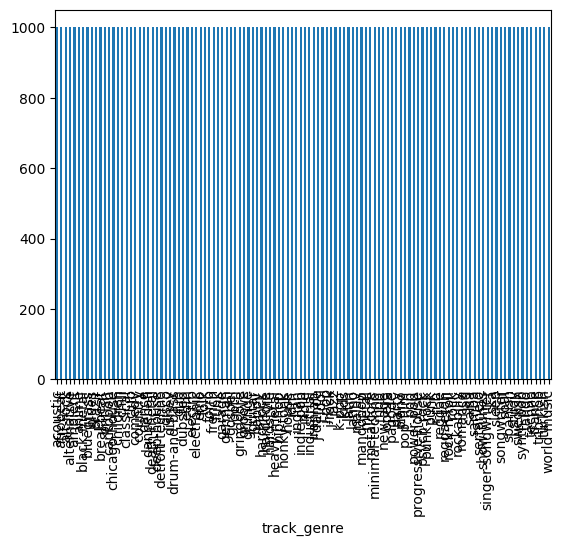

In [ ]:
#all bars look approximately same length
df['track_genre'].value_counts().plot(kind='bar')

###**Artists represented in the dataset**

In [ ]:
df['artists'].value_counts()

,count
artists,
The Beatles,279
George Jones,271
Stevie Wonder,236
Linkin Park,224
Ella Fitzgerald,222
...,...
Hillsong Worship;TAYA;David Ware,1
for KING & COUNTRY;Andy Mineo,1
Bethel Music;Francesca Battistelli,1


###**Value Counts of Categorical Variables**

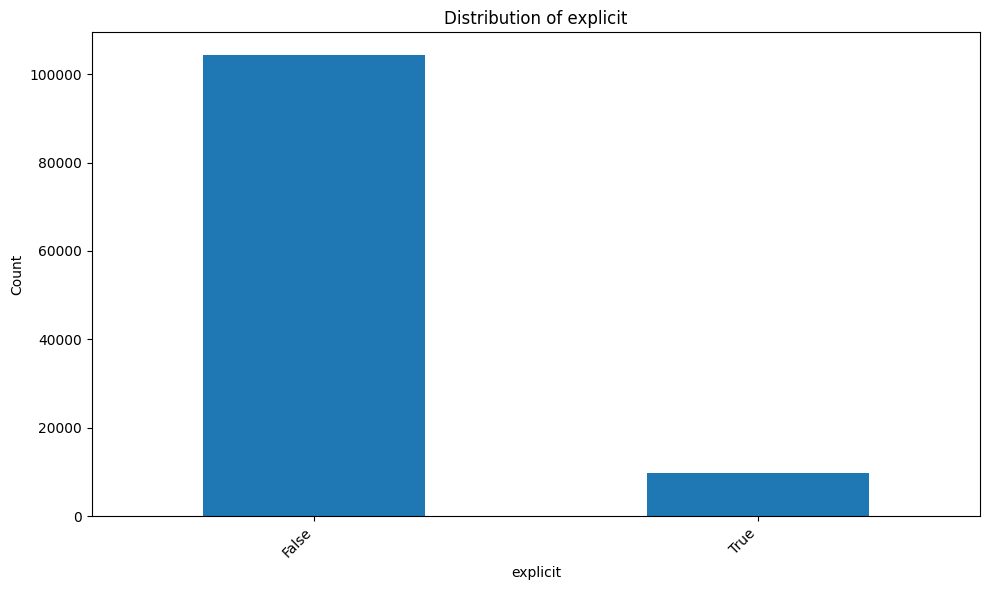

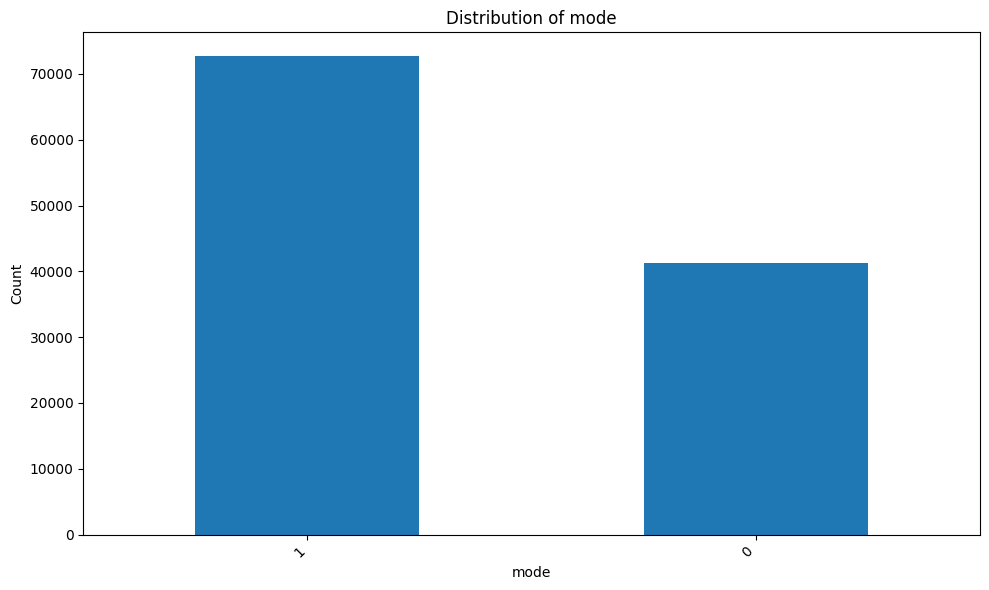

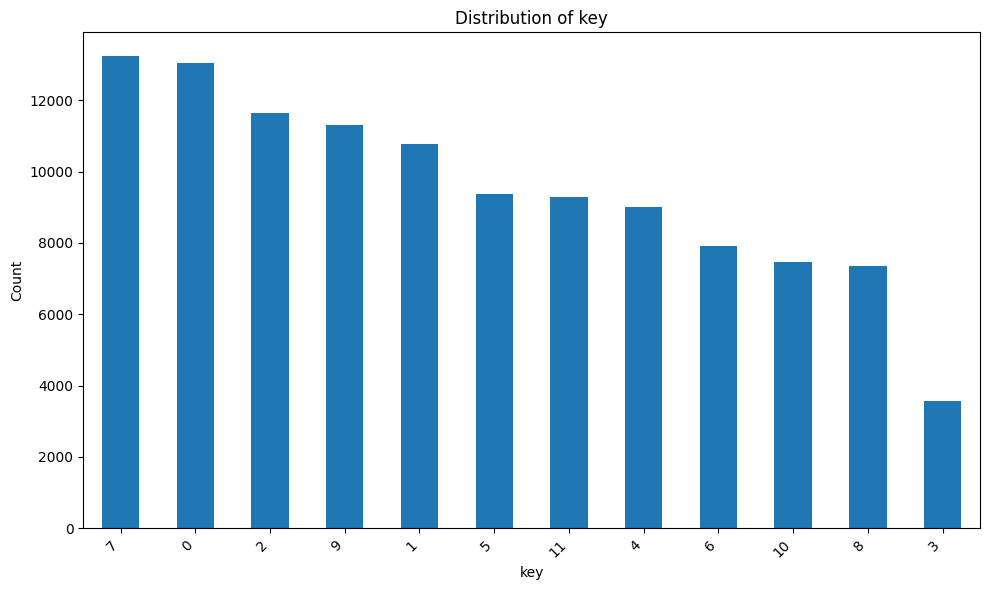

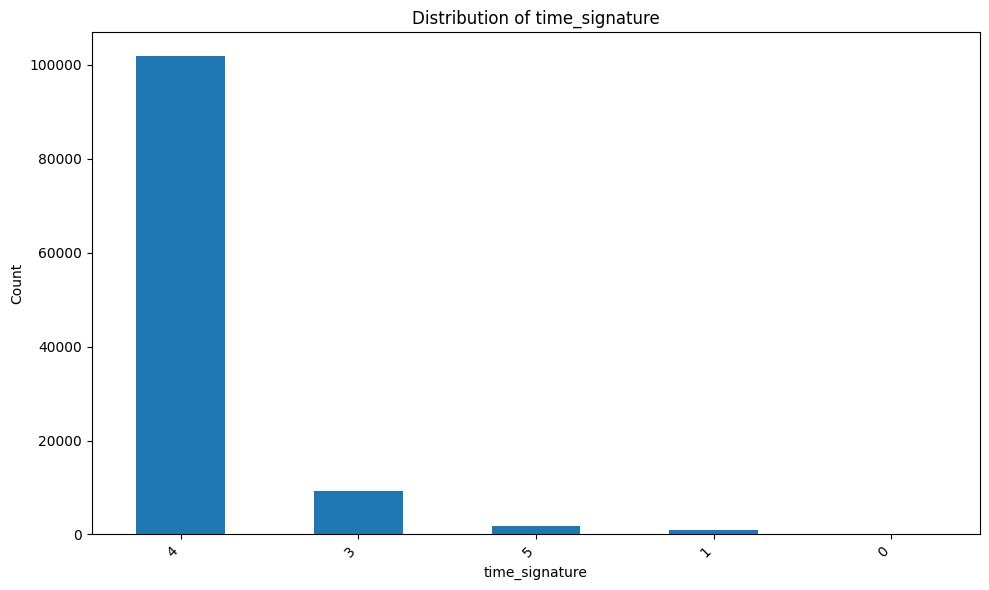

In [ ]:
categorical_cols = ['explicit', 'mode', 'key', 'time_signature']

for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    df[col].value_counts().plot(kind='bar')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()



 **Bar Charts Analysis**

 1. **Key**

   * Most songs fall into just a handful of keys (using Spotify’s 0–11 notation):

     * Key 1 (C♯/D♭) and Key 0 (C) each appear \~13 000 times.
     * Keys 2 (D), 9 (A), and 1(C♯/D♭) again are the next most common.
     * The least-used key is Key 3 (E♭), with only \~3 500 tracks.
   * **Takeaway:** Songwriters in this dataset disproportionately favor certain tonalities—C, C♯, D and A major/minor—as the basis for popular music.

2. **Time Signature**

   * **4/4 dominates** by a huge margin (\~102 000 tracks).
   * 3/4 turns up in \~10 000 songs, 5/4 in \~2 000, and 1/4 or irregular meters are almost nonexistent.
   * **Takeaway:** The dataset is overwhelmingly “straight” 4‑beat pop/rock/dance music; odd meters are rare.

3. **Mode (Major vs. Minor)**

   * **Major (mode = 1)**: \~72 000 tracks (\~63%)
   * **Minor (mode = 0)**: \~42 000 tracks (\~37%)
   * **Takeaway:** Major-key compositions are significantly more prevalent in the dataset. This reflects their common usage in many popular music genres, forming a familiar tonal foundation for a majority of the tracks analyzed.

4. **Explicit Lyrics Flag**

  Explicit songs make up a small proportion of the dataset.

---

* The dataset follows conventions of mainstream Western music:

  * **4/4 time**
  * **major mode**
* **Genres or niche categories** (like odd meters or exotic keys) are underrepresented.



###**Outliers that exist among continous variables**

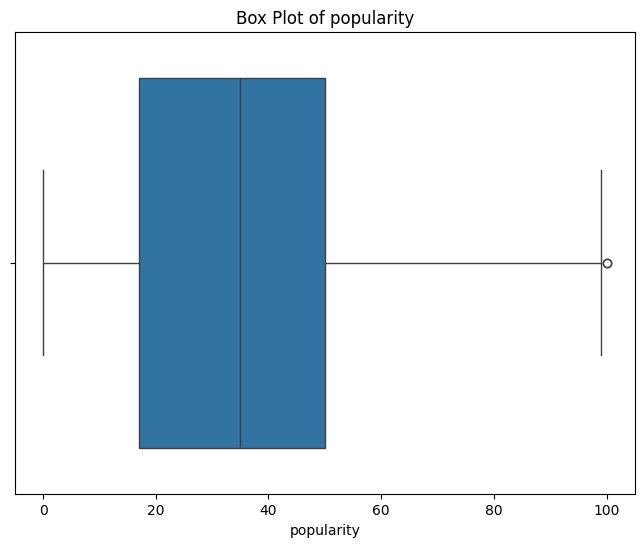

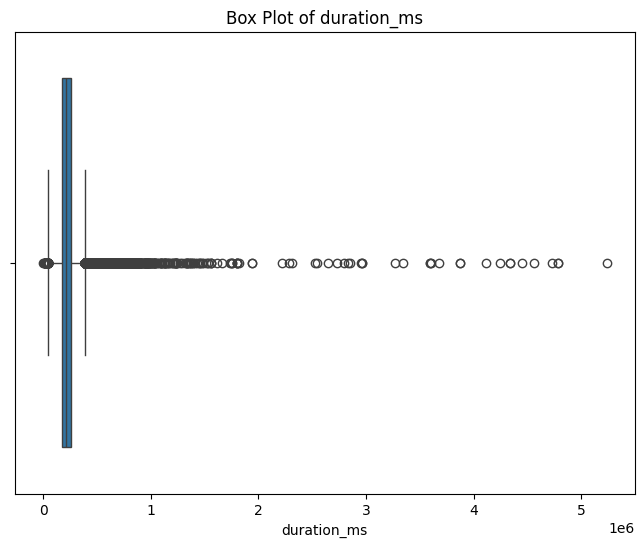

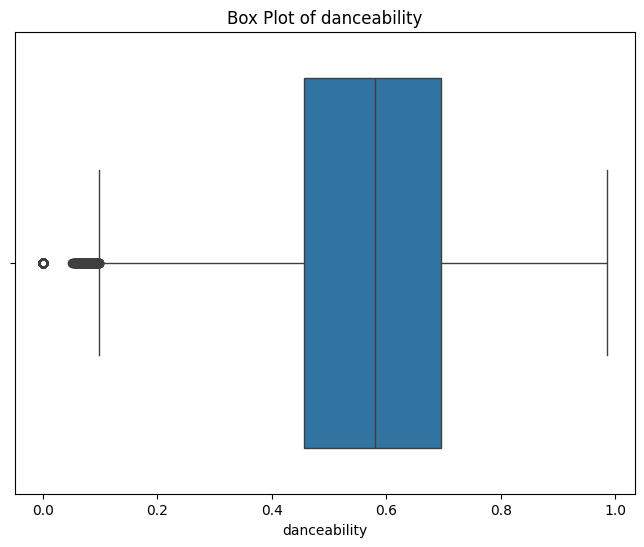

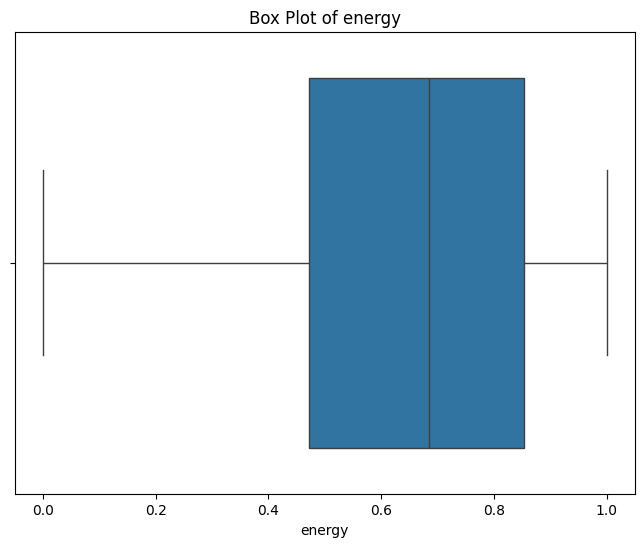

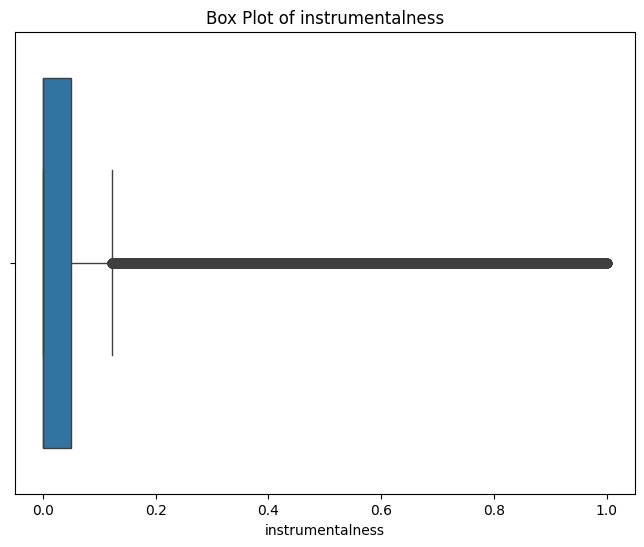

...

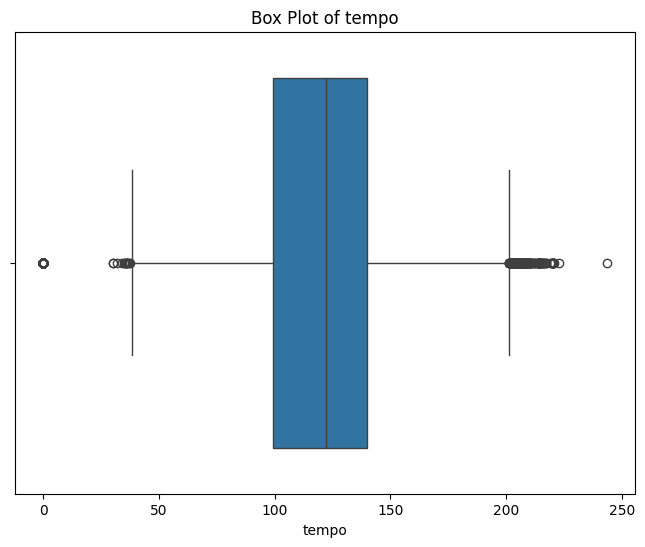

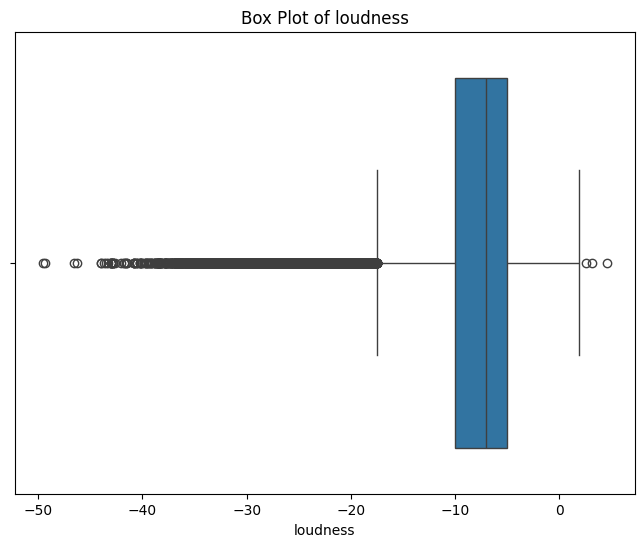

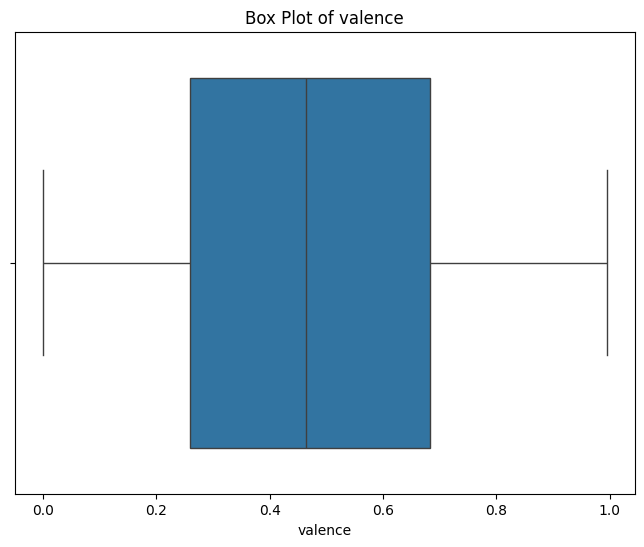

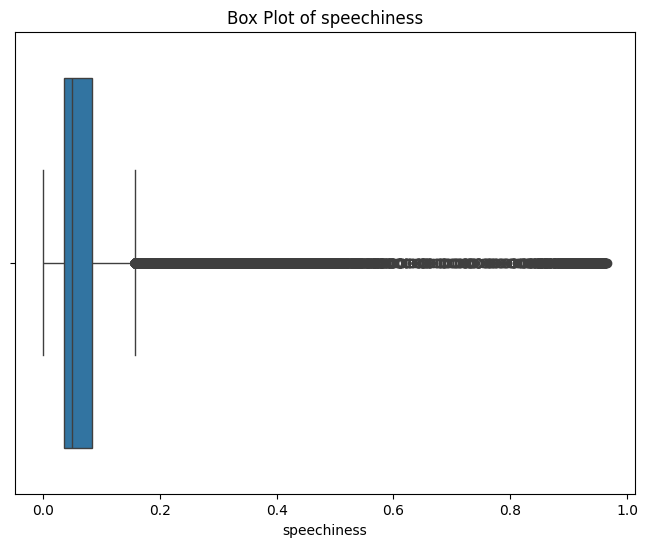

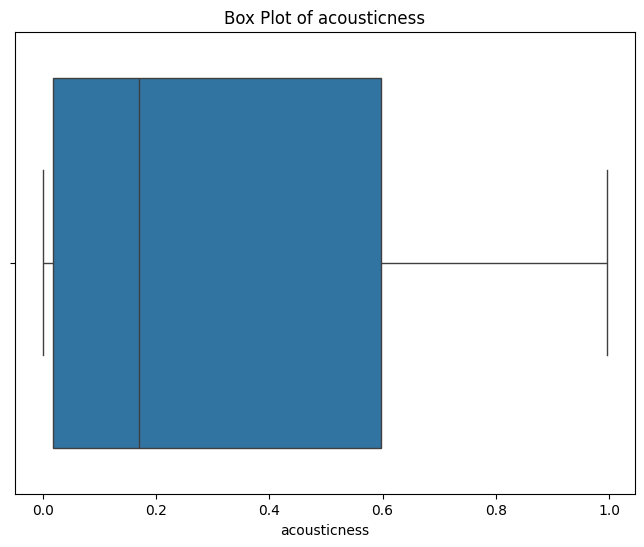

In [ ]:
# Box plots for continuous variables to visualize outliers
continuous_cols = ['popularity', 'duration_ms', 'danceability', 'energy', 'instrumentalness', 'liveness', 'tempo', 'loudness', 'valence', 'speechiness', 'acousticness']
for col in continuous_cols:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df[col])
    plt.title(f'Box Plot of {col}')
    plt.show()

## **Outliers Analysis**

1. **Popularity**

   * **Outlier behavior:**

     * Values range from 0 to 100 with a long right tail—very few tracks exceed 90, and many cluster below 50.
     * These extremes remain in the dataset to preserve rare high‑popularity cases.

2. **Duration\_ms**

   * **Outlier behavior:**

     * Median track length is about 212,906 ms (≈ 3 min 32 s), with the 75th percentile around 261,506 ms.
     * A small number of entries extend beyond several million milliseconds (over an hour), which may represent live sets or data artifacts.

3. **Tempo**

   * **Outlier behavior:**

     * Most tempos fall between 60 BPM and 200 BPM, with occasional values below 40 BPM or above 240 BPM.

4. **Loudness**

   * **Outlier behavior:**

     * Centered around –7 to –8 dB for most tracks, but some recordings dip below –40 dB or rise near 0 dB.

5. **Instrumentalness, Speechiness, Liveness, Acousticness, Danceability, Energy, Valence**

   * **Outlier behavior:**

     * All bounded between 0 and 1.
     * Instrumentalness and liveness often spike at the extremes (near 0 or 1), while speechiness similarly piles up at low values.
     * Acousticness, danceability, energy, and valence show varied, sometimes skewed distributions within those bounds.

---

**Note: Because both the Random Forest regression and classification models to be used later handle outliers natively—through split‑based insensitivity and ensemble averaging—no explicit outlier removal, capping, or winsorizing will be applied. All observed extremes will remain intact to preserve potentially valuable signals.**


### **Correlations between continuous variables**

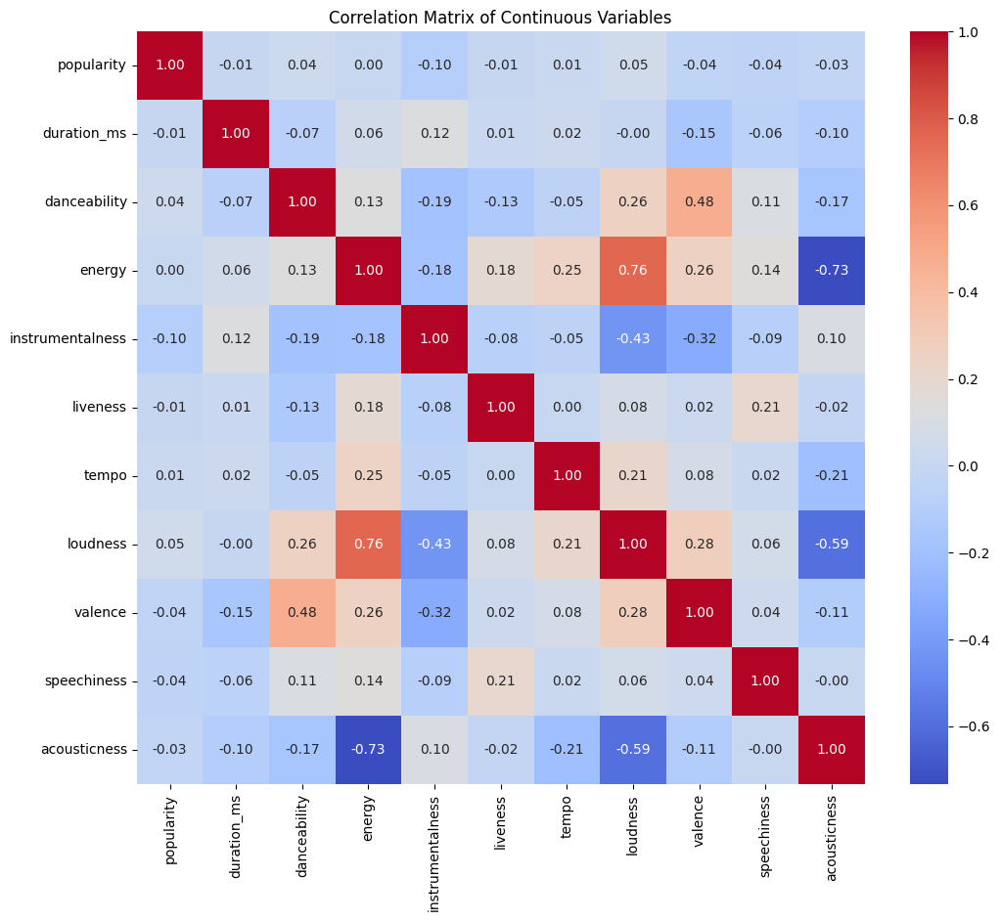

In [ ]:
# Correlation matrix for continuous variables
continuous_cols = ['popularity', 'duration_ms', 'danceability', 'energy', 'instrumentalness', 'liveness', 'tempo', 'loudness', 'valence', 'speechiness', 'acousticness']
correlation_matrix = df[continuous_cols].corr()

# Visualizing the correlation matrix using a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Continuous Variables')
plt.show()


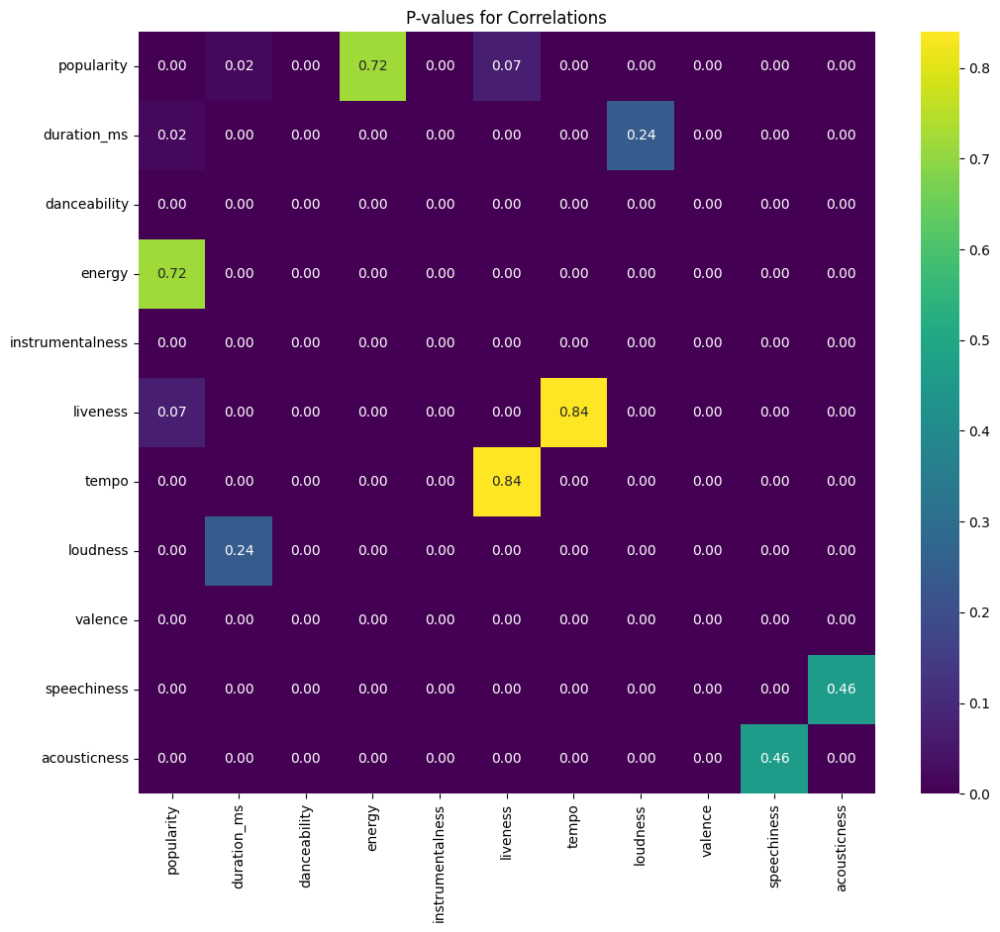

In [ ]:
# Extract p-values from the correlation matrix
p_values = np.zeros_like(correlation_matrix)
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        col1 = correlation_matrix.columns[i]
        col2 = correlation_matrix.columns[j]
        correlation_coefficient, p_value = pearsonr(df[col1], df[col2])
        p_values[i, j] = p_value
        p_values[j, i] = p_value


p_values_df = pd.DataFrame(p_values, index=correlation_matrix.columns, columns=correlation_matrix.columns)

# Create the plot
plt.figure(figsize=(12, 10))
sns.heatmap(p_values_df, annot=True, cmap='viridis', fmt=".2f")
plt.title('P-values for Correlations')
plt.show()

**Evaluating Correlations and Significance**

 1. **Popularity shows no strong linear relationships**

- All Pearson correlation coefficients (r) between popularity and other audio features are weak, falling between –0.10 and +0.05. While some of these weak correlations may be statistically significant due to the large dataset size (meaning they are unlikely to be exactly zero in the population), their practical significance in terms of linear predictive power is minimal.
- **Important**: Pearson correlation only captures **linear** relationships. So even if a feature seems unrelated here, it may still contribute **non-linearly** (as shown by the Random Forest results later in this notebook).

---

2. **Very strong energy–loudness link**

- **r ≈ +0.76**, p < 0.001
- As tracks get louder (higher dB), their measured “energy” also rises in lockstep — these two features essentially track each other.

---

3. **Strong inverse acousticness–energy (and loudness) relationships**

- **Energy vs. acousticness:** r ≈ –0.73, p < 0.001  
- **Loudness vs. acousticness:** r ≈ –0.59, p < 0.001  
- More acoustic tracks are typically softer and less energetic — likely representing unplugged or organic genres.

---

4. **Moderate danceability–valence coupling**

- **r ≈ +0.48**, p < 0.001  
- Happier-sounding tracks (high valence) tend to be more danceable — common in upbeat pop and disco.

---

5. **Instrumentalness inversely tied to loudness & valence**

- **Instrumentalness vs. loudness:** r ≈ –0.43  
- **Instrumentalness vs. valence:** r ≈ –0.32  
- Instrumental tracks tend to be quieter and more serious in tone — fewer "happy, loud instrumentals."

---

6. **Weaker but still significant links**

- **Tempo vs. energy:** r ≈ +0.25  
- **Tempo vs. loudness:** r ≈ +0.21  
- **Speechiness vs. liveness:** r ≈ +0.21  
- Faster songs are slightly more energetic/louder. Spoken-word content often registers higher “liveness,” possibly due to live recordings or rap delivery.





#**Cluster Analysis**

**Goal:Identify what audio features are distinctive/similiar to songs of different genres**

 **Elbow test**

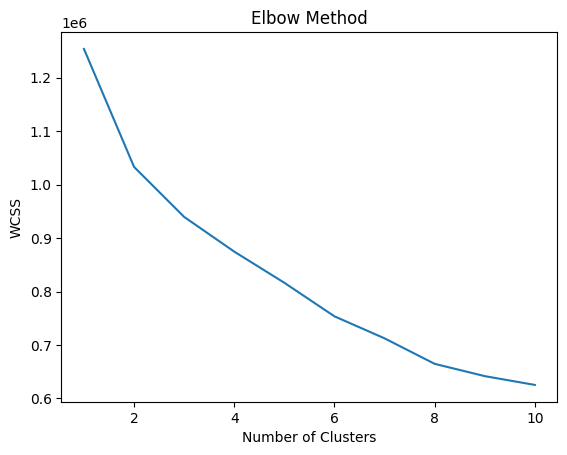

In [ ]:

# Creating a copy of the dataframe
df_scaled = df.copy()

# Selecting the features to be used for clustering
features = ['popularity', 'duration_ms', 'danceability', 'energy', 'instrumentalness', 'liveness', 'tempo', 'loudness', 'valence', 'speechiness', 'acousticness']
X = df_scaled[features]

# Scaling the data using StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Using the elbow method to find the optimal number of clusters
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

# Plot the elbow graph
plt.plot(range(1, 11), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()


**Finding Silhouette Scores**

k =  2 → silhouette score = 0.222
k =  3 → silhouette score = 0.140
k =  4 → silhouette score = 0.145
k =  5 → silhouette score = 0.146
k =  6 → silhouette score = 0.147
k =  7 → silhouette score = 0.141
k =  8 → silhouette score = 0.154
k =  9 → silhouette score = 0.143
k = 10 → silhouette score = 0.143


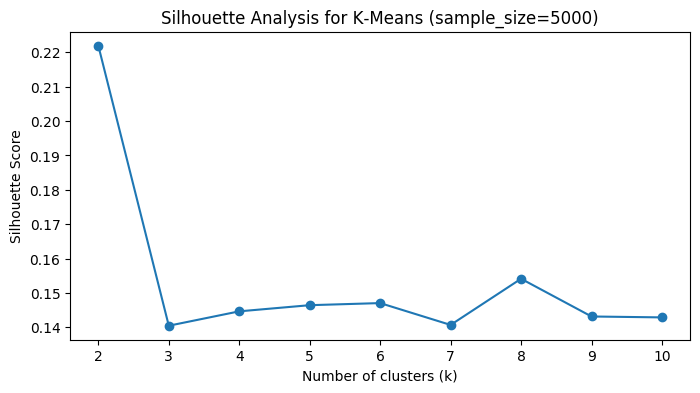

In [ ]:
range_n_clusters  = range(2, 11)
silhouette_scores = []
sample_size       = 5000   # ← size of the internal subsample

for k in range_n_clusters:
    km     = KMeans(n_clusters=k, n_init=10, random_state=42)
    labels = km.fit_predict(X_scaled)
    score  = silhouette_score(
        X_scaled,
        labels,
        sample_size=sample_size,
        random_state=42
    )
    silhouette_scores.append(score)
    print(f"k = {k:2d} → silhouette score = {score:.3f}")

plt.figure(figsize=(8, 4))
plt.plot(range_n_clusters, silhouette_scores, marker="o")
plt.xticks(range_n_clusters)
plt.xlabel("Number of clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Analysis for K‑Means (sample_size=5000)")
plt.show()


**How I determined which k value to use:**

The elbow plot shows that most of the gain in cluster compactness happens when you go from 1 to 2 or 3 clusters, and beyond that the benefit tapers off evenly.

The silhouette score is highest at k=2, indicating two very well‑separated groups, but it only drops slightly for k between 3 and 10.

**In real terms, having only two clusters forces very different musical styles into the same group, which isn’t very useful. By choosing k = 5, we are able to retain reasonably tight clusters (silhouette ≈0.145) while capturing five distinct “archetypes” of music.** This gives enough room to differentiate styles like rock, ambient, dance, acoustic, and techno without overcomplicating things. Overall, k = 5 strikes a practical balance between mathematical cohesion and meaningful, interpretable segments.

In [ ]:
features = ['popularity', 'duration_ms', 'danceability', 'energy', 'instrumentalness', 'liveness', 'tempo', 'loudness', 'valence', 'speechiness', 'acousticness']
X = df[features]

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Perform KMeans clustering with k=5
kmeans = KMeans(n_clusters=5, random_state=42, n_init='auto')
df['cluster'] = kmeans.fit_predict(X_scaled)

# Visualizing the clusters using two principal components
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)
df['PC1'] = principal_components[:, 0]
df['PC2'] = principal_components[:, 1]

# Create interactive scatter plot with Plotly
fig = px.scatter(df, x='PC1', y='PC2', color='cluster',
                 hover_data=['track_name', 'track_genre'],
                 title='Clusters Visualization (PCA with Hover Info)')

fig.show()

print("Hover over the points to see the track names and genres")

Hover over the points to see the track names and genres


Based on the scatterplot, we can conclude that most tracks share a **similiar audio profile in terms of tempo, energy, loudness, etc.** The dataset is dominated by “mainstream”-sounding songs whose feature values sit in the mid-range rather than at extremes.

In [ ]:
df.groupby("cluster")[features].mean()

,popularity,duration_ms,danceability,energy,instrumentalness,liveness,tempo,loudness,valence,speechiness,acousticness
cluster,,,,,,,,,,,
0,37.006228,235657.682994,0.468919,0.819545,0.036304,0.348504,137.077796,-5.607968,0.391905,0.116663,0.125314
1,35.106243,215785.797003,0.535509,0.389592,0.034050,0.172801,113.642629,-10.458370,0.398116,0.057259,0.659134
2,27.796445,212975.260580,0.349350,0.180119,0.767571,0.172092,102.976872,-20.960483,0.188317,0.052356,0.860085
3,32.090008,209354.784286,0.692324,0.730683,0.018756,0.163701,119.160689,-6.259067,0.674926,0.089822,0.192289
4,27.765664,309339.118260,0.582097,0.749741,0.767075,0.175075,127.348117,-8.384638,0.334927,0.070034,0.095895


In [ ]:
# Count the most common genres in each cluster
genre_by_cluster = df.groupby("cluster")["track_genre"].value_counts().groupby(level=0).head(5)

# Display as a clean table
genre_by_cluster.unstack(level=1).fillna(0).astype(int)

# Set display options to show all columns
pd.set_option('display.max_columns', None)

# Display the table
print(genre_by_cluster)

# Code to reset display options
pd.reset_option('display.max_columns')

cluster  track_genre   
0        metalcore         890
         comedy            786
         heavy-metal       764
         hardstyle         712
         grunge            693
1        tango             851
         honky-tonk        804
         romance           764
         cantopop          742
         jazz              723
2        sleep             842
         new-age           785
         classical         762
         ambient           659
         piano             563
3        latino            920
         reggaeton         919
         reggae            896
         latin             862
         dancehall         858
4        minimal-techno    883
         detroit-techno    809
         techno            635
         chicago-house     585
         trance            520
Name: count, dtype: int64


**Key Features of each Cluster**

---

* **Cluster 0: High-Energy Rock and Metal**

  * **Key audio traits:** Highest popularity (\~37), very high energy (0.82) & loudness (–5.6 dB), lower danceability (0.47), higher liveness (0.35)
  * **Top genres by count:** metalcore, heavy‑metal, hardstyle, grunge, comedy

* **Cluster 1: Global & Traditional Mix**

  * **Key audio traits:** Mid–high popularity (\~35), low energy (0.39) & quieter (–10.5 dB), moderate danceability (0.54), high acousticness (0.66)
  * **Top genres by count:** tango, honky‑tonk, romance, cantopop, jazz

* **Cluster 2: Ambient & Classical Instrumental**

  * **Key audio traits:** Lower popularity (\~28), very high instrumentalness (0.77), very low energy (0.18) & loudness (–21 dB), slow tempo (\~103 BPM)
  * **Top genres by count:** sleep, new‑age, classical, ambient, piano

* **Cluster 3: Upbeat Dance & Pop**

  * **Key audio traits:** Moderate popularity (\~32), high danceability (0.69) & energy (0.73), high valence (0.67), low acousticness (0.19)
  * **Top genres by count:** latino, reggaeton, reggae, latin, dancehall

* **Cluster 4: Energetic Electronic & Techno**

  * **Key audio traits:** Lower popularity (\~28), longest duration (\~309 s), high instrumentalness (0.77) & energy (0.75), moderate danceability (0.58)
  * **Top genres by count:** minimal‑techno, detroit‑techno, techno, chicago‑house, trance


# **Kruskal-Wallis Test: Genre's Impact on Popularity**


**Goal: To determine if there is a statistically significant difference in the median popularity among the different genres.**

**Null hypothesis (H₀):** All genres have the same median popularity.

**Alternative (H₁):** At least one genre’s median popularity differs.


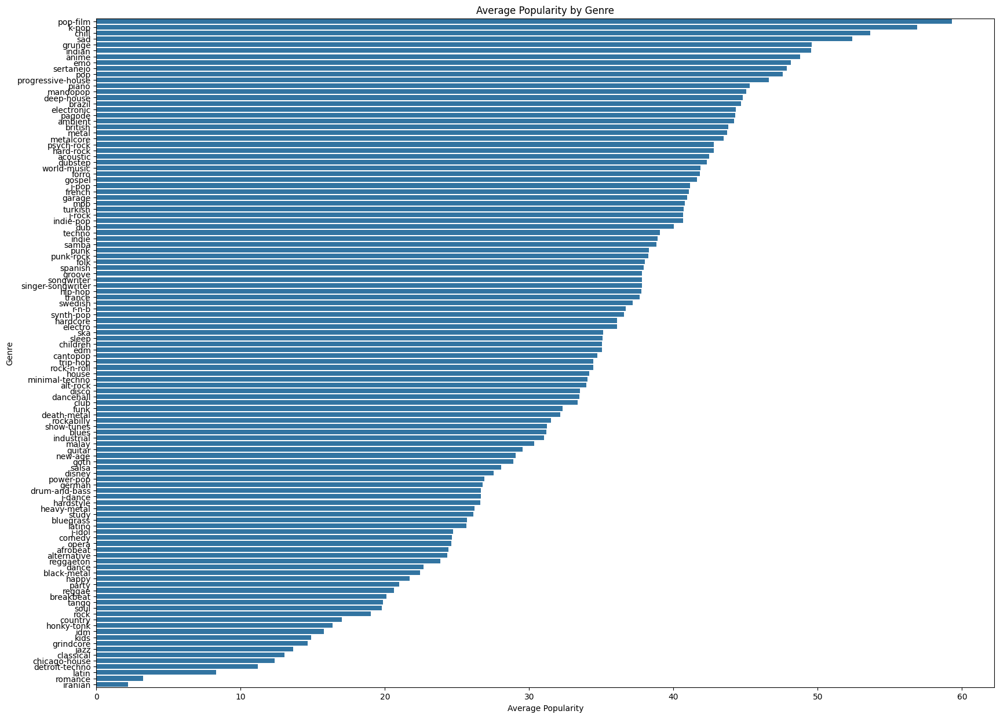

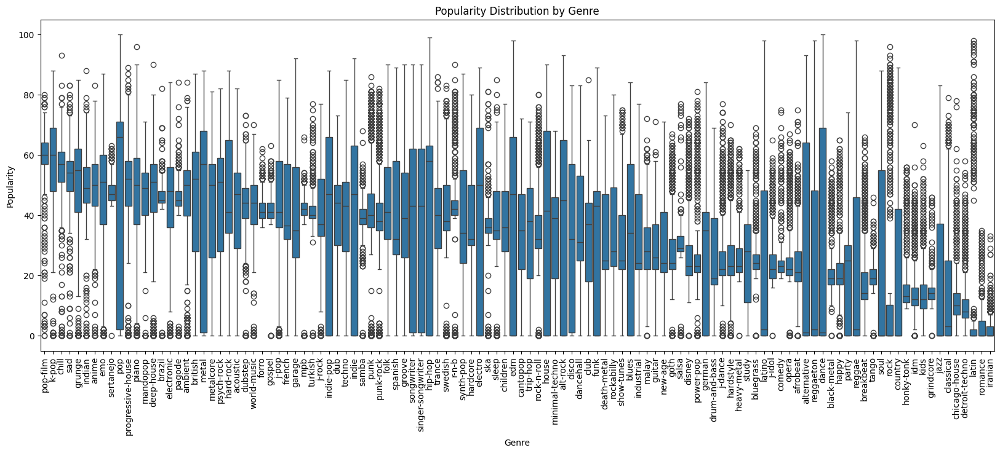

Kruskal-Wallis H-statistic: 31281.56091000135, p-value: 0.0


In [ ]:
# Group by genre and aggregate popularity
genre_popularity = df.groupby("track_genre")["popularity"].agg(["mean", "count"])

# Sort by mean popularity
genre_popularity = genre_popularity.sort_values("mean", ascending=False)

# Create the horizontal bar chart
plt.figure(figsize=(20, 15))
sns.barplot(x="mean", y=genre_popularity.index, data=genre_popularity, orient="h")
plt.title("Average Popularity by Genre")
plt.xlabel("Average Popularity")
plt.ylabel("Genre")
plt.show()

# Create box plots by genre
plt.figure(figsize=(20, 7))
sns.boxplot(x="track_genre", y="popularity", data=df, order=genre_popularity.index)
plt.xticks(rotation=90)
plt.title("Popularity Distribution by Genre")
plt.xlabel("Genre")
plt.ylabel("Popularity")
plt.show()

# Perform Kruskal-Wallis test
from scipy.stats import f_oneway, kruskal

# Filter data for genres
filtered_df = df[df["track_genre"].isin(genre_popularity.index)]

# Perform Kruskal-Wallis test (non-parametric)
H_statistic, p_value = kruskal(*[group["popularity"].values for name, group in filtered_df.groupby("track_genre")])
print(f"Kruskal-Wallis H-statistic: {H_statistic}, p-value: {p_value}")



The Kruskal–Wallis H‑statistic of 31 281.56 with a p‑value effectively = 0 means: Popularity distributions do differ significantly across genres.

**H ≈ 31 281** is extremely large, indicating the rank‑sum differences between your genre groups are huge.

**p ≈ 0 (< 0.001)** tells us we can reject H₀ with very high confidence.

**Conclusion: Genre is a contribtuing factor to a song's popularity.**


#**Profile of Top 25% Most Popular Songs**

In [ ]:
# Calculate the 75th percentile of popularity
popularity_75th = df['popularity'].quantile(0.75)

# Filter songs at or above the 75th percentile
top_songs = df[df['popularity'] >= popularity_75th]

# Count the number of songs at or above 75th percentile
num_top_songs = len(top_songs)
print(f"Number of songs in the 75th percentile of popularity: {num_top_songs}")

# Sort the songs by popularity in descending order and get the top 10
top_10_songs = top_songs.sort_values('popularity', ascending=False).head(10)

# Display the top 10 songs
print("\nTop 10 most popular songs:")
print(top_10_songs[['track_name', 'artists', 'popularity']])


Number of songs in the 75th percentile of popularity: 29367

Top 10 most popular songs:
                                  track_name                  artists  \
20001              Unholy (feat. Kim Petras)     Sam Smith;Kim Petras   
81051              Unholy (feat. Kim Petras)     Sam Smith;Kim Petras   
51664  Quevedo: Bzrp Music Sessions, Vol. 52         Bizarrap;Quevedo   
89411                             La Bachata            Manuel Turizo   
68303                             La Bachata            Manuel Turizo   
30003                        I'm Good (Blue)  David Guetta;Bebe Rexha   
20008                        I'm Good (Blue)  David Guetta;Bebe Rexha   
81210                        I'm Good (Blue)  David Guetta;Bebe Rexha   
67356                             La Bachata            Manuel Turizo   
88410                             La Bachata            Manuel Turizo   

       popularity  
20001         100  
81051         100  
51664          99  
89411          98  
68303   

**There are approximately 29,367 songs at or above the 75 percentile of popularity(top 25%)**

The same track_name and artist show up more than once in the “top 10” list, indicating that they have probably been released on different albums or editions. For example: Those duplicates aren’t data errors so much as they reflect real-world releases—original album, deluxe version, greatest‑hits, soundtracks, or remixes.

##**Distribution of features within these tracks**

**Features in Top Popularity Tier**

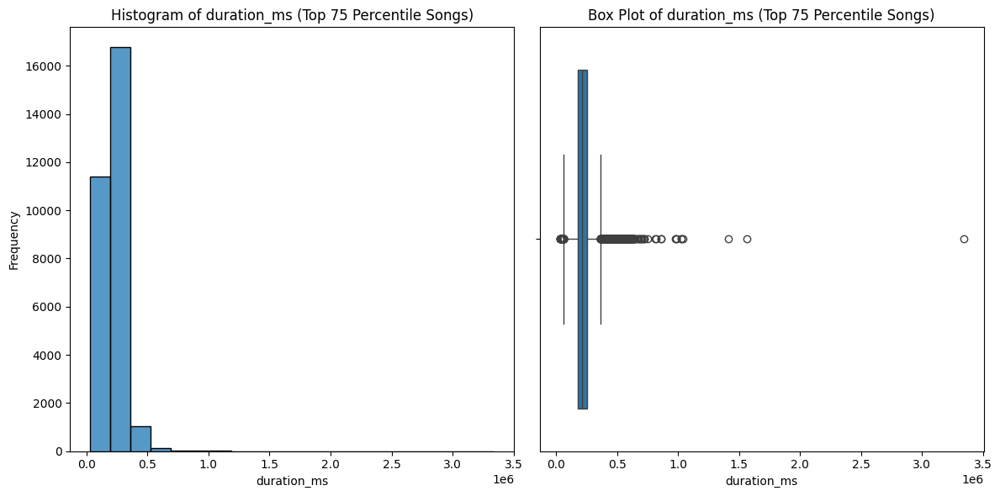

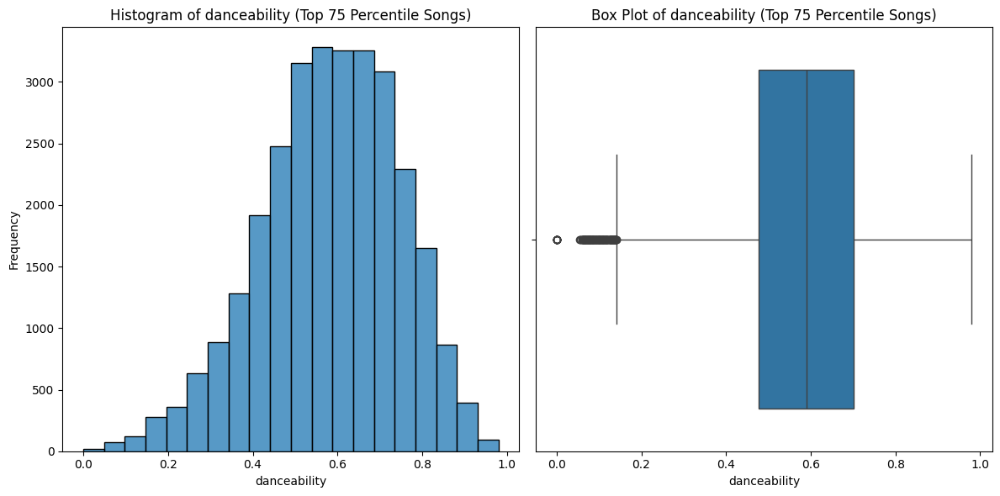

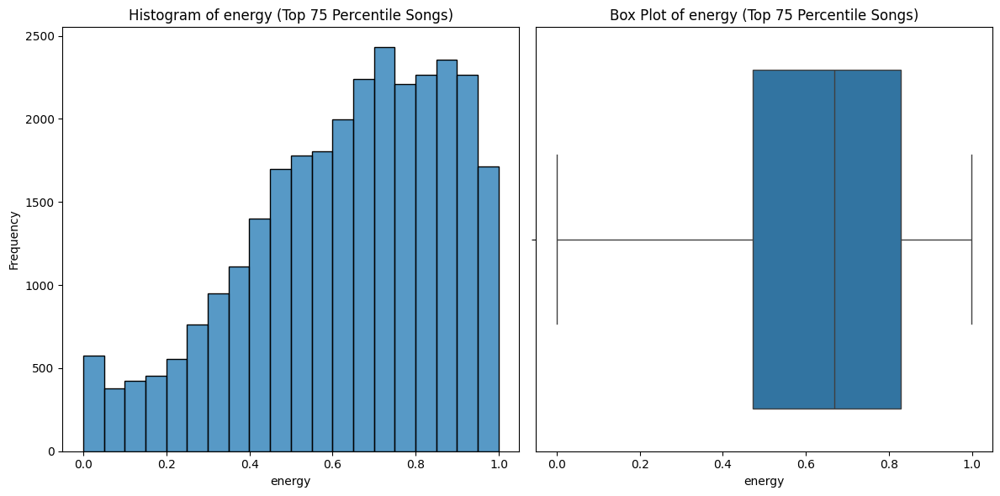

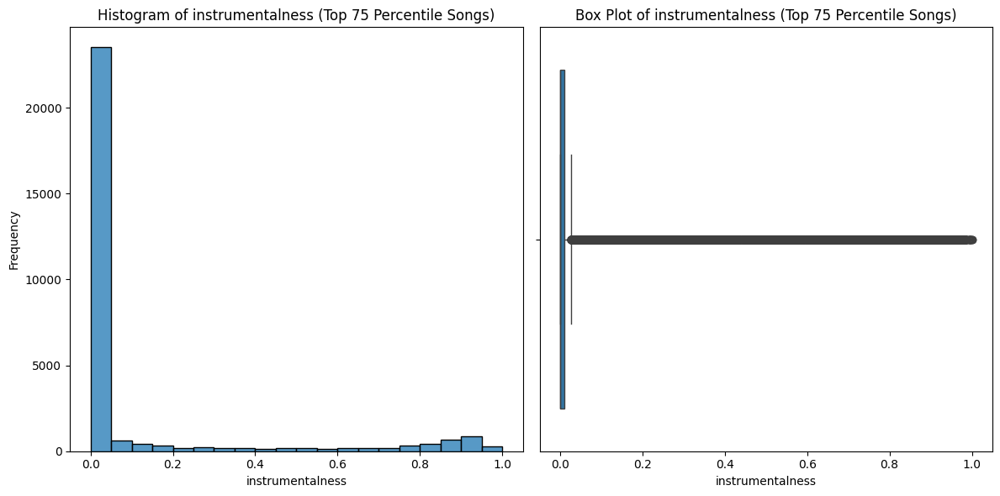

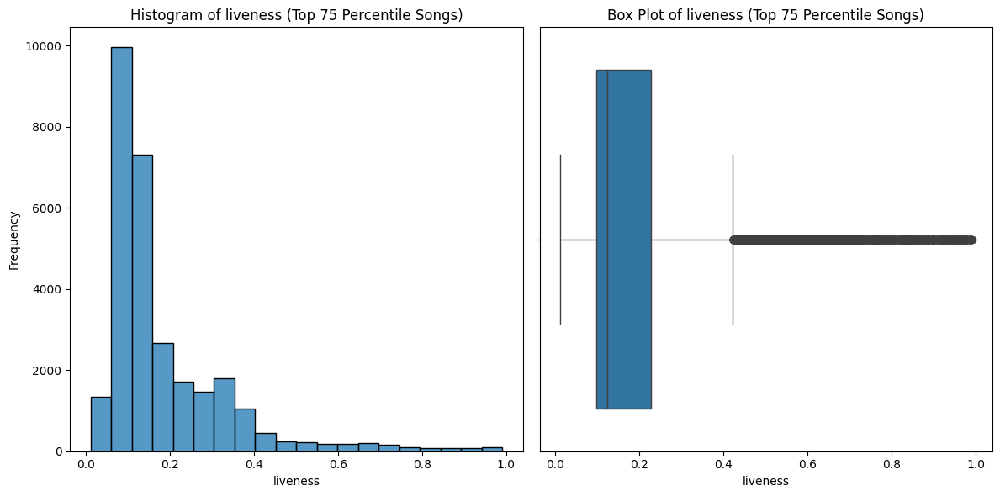

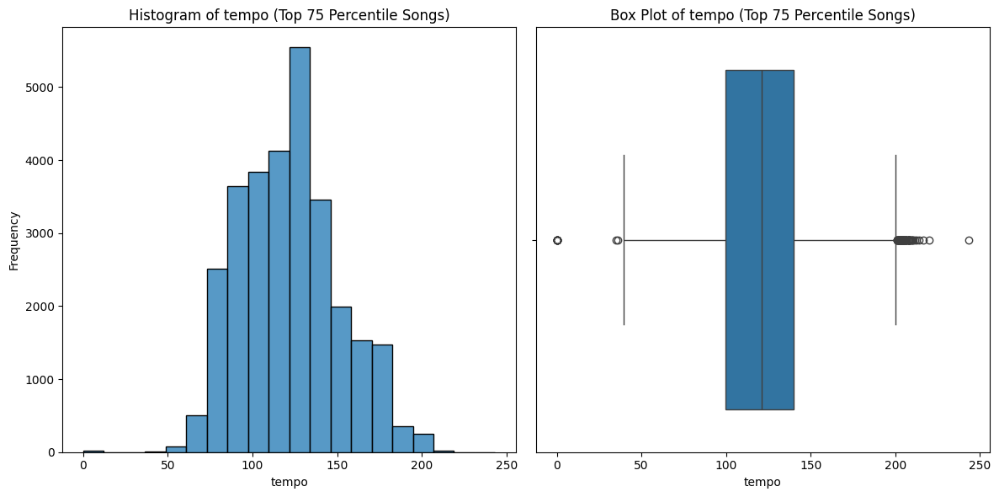

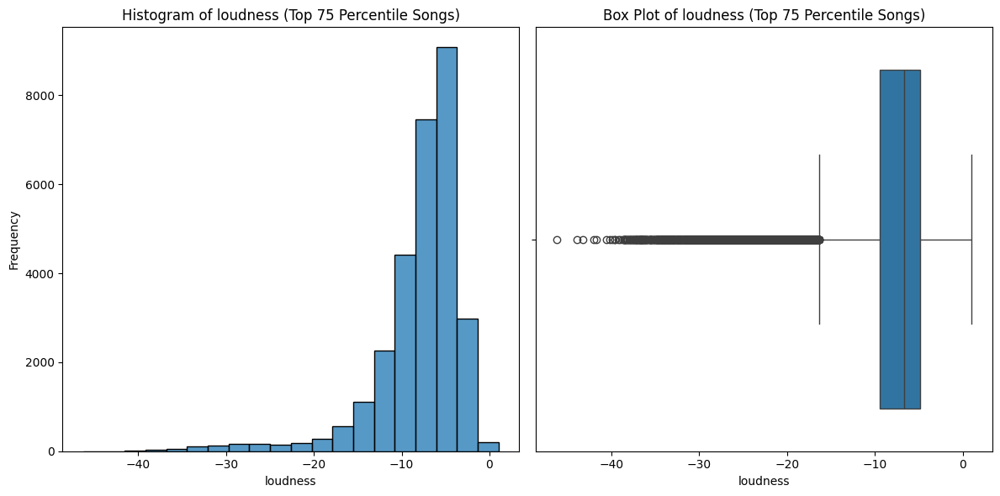

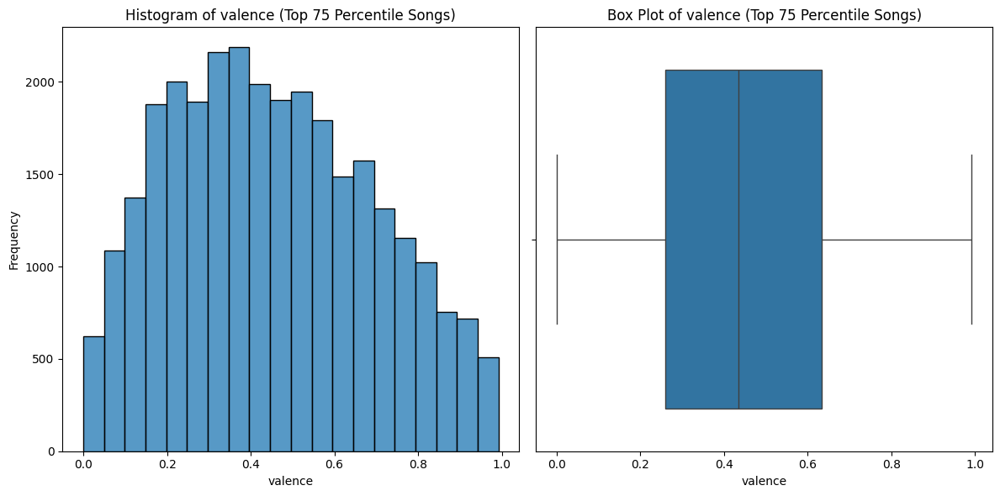

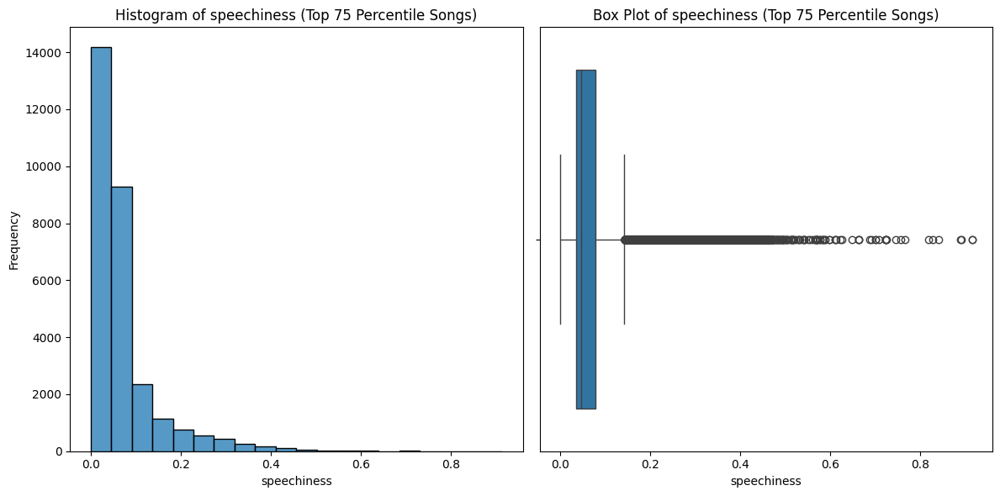

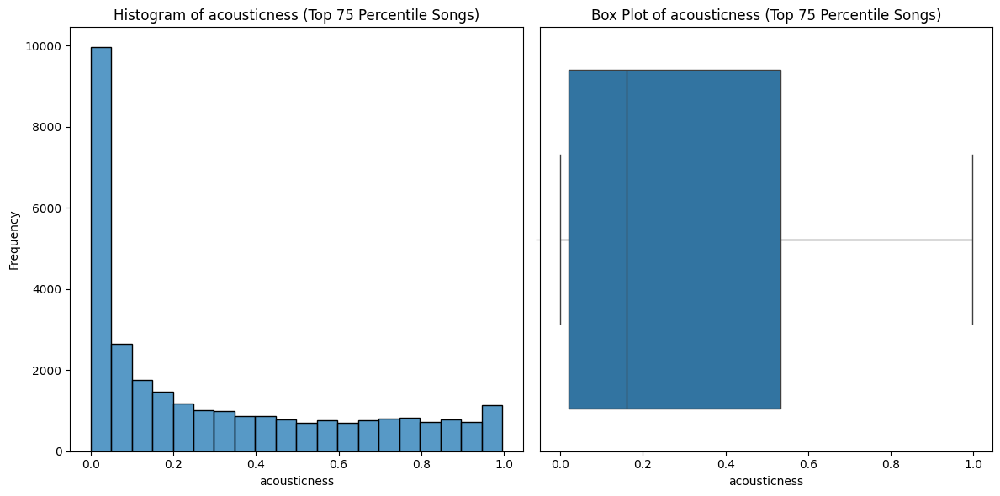

In [ ]:
# Calculate the 75th percentile of popularity
popularity_threshold = df['popularity'].quantile(0.75)

# Filter the DataFrame for songs in the top 75th percentile
top_songs = df[df['popularity'] >= popularity_threshold]

# Key features to visualize
key_features = ['duration_ms', 'danceability', 'energy', 'instrumentalness',
                'liveness', 'tempo', 'loudness', 'valence', 'speechiness',
                'acousticness']

# Side-by-side histograms and box plots for each key feature
for feature in key_features:
    plt.figure(figsize=(12, 6)) # Adjust figure size to accommodate two plots

    # Histogram
    plt.subplot(1, 2, 1) # 1 row, 2 columns, 1st plot
    sns.histplot(top_songs[feature], bins=20)
    plt.title(f'Histogram of {feature} (Top 75 Percentile Songs)')
    plt.xlabel(feature)
    plt.ylabel('Frequency')

    # Box Plot
    plt.subplot(1, 2, 2) # 1 row, 2 columns, 2nd plot
    sns.boxplot(x=top_songs[feature])
    plt.title(f'Box Plot of {feature} (Top 75 Percentile Songs)')
    plt.xlabel(feature)
    plt.ylabel('')

    plt.tight_layout()
    plt.show()

## **Analysis of the Key Features**

**1. Duration (Seconds/Minutes)**

**Observation:** Top songs run approximately 180–270 seconds (3.0–4.5 minutes), with a median duration of about 210 seconds (~3.5 minutes).

**Implication:** This concentration around a 3–4 minute mark could reflect industry norms or programming considerations for track length.

**2. Danceability & Energy**

**Observation:** Median danceability increases slightly from 0.58 to 0.59, while median energy decreases modestly from 0.685 to 0.668.

**Implication:** The balance of danceability and energy in these tracks may point to production choices that favor certain rhythmic and dynamic profiles.

**3. Instrumentalness & Acousticness**

**Observation:** About 75 % of top‑quartile songs have instrumentalness < 0.01, and the median acousticness is around 0.16.

**Implication:** A strong presence of vocals and produced elements appears more common among these popular tracks.

**4. Valence (“Mood”)**

**Observation:** Median valence in hits (0.435) is slightly lower than the overall dataset median (0.464).

**Implication:** Emotional tone alone does not fully distinguish top‑ranking songs, suggesting mood interacts with other musical factors.

**5. Tempo & Loudness**

**Observation:**Top tracks typically fall between 100–140 BPM (median ~ 121 BPM) and have loudness levels centered around –9.5 dB to –4.9 dB (median –6.7 dB).

**Implication:** These tempo and loudness ranges may align with common production practices for widely circulated tracks.

**6. Liveness & Speechiness**

**Observation:** Hits show lower liveness (median ~ 0.12) and similar speechiness (median ~ 0.047) compared to the full dataset.

**Implication:** Studio‑focused recordings and typical vocal prominence are characteristics seen more often among higher‑popularity songs.



# **Random Forest Regression on Categorical Variables**

**Goal:Determining the extent to which categorical variables(genre, mode, key signature, explicitness, time signature) and artist contribute to song popularity**

**Why Random Forest?**

**Adaptability to Data Distributions:** As a non-parametric method, it makes no assumptions about how audio features are distributed. This makes it highly suitable for data like Spotify's, which often exhibits skewed and multimodal patterns.

**Simplified Data Preprocessing:** The model requires minimal data preparation, such as strict scaling or normalization, and can intrinsically handle missing values within its structure.

**Robustness to Outliers and Noise:** The model's decision-making, based on value ordering rather than magnitude, ensures that extreme outliers (e.g., unusually high loudness) do not disproportionately influence its thresholds.

**Effective Handling of High-Dimensional and Correlated Data:** It efficiently manages datasets with a large number of features by considering only a random subset of variables at each decision point. The algorithm also demonstrates tolerance for multicollinearity, meaning that correlated features (like energy and loudness) do not typically degrade its performance.




Random Forest R² score: 0.1381


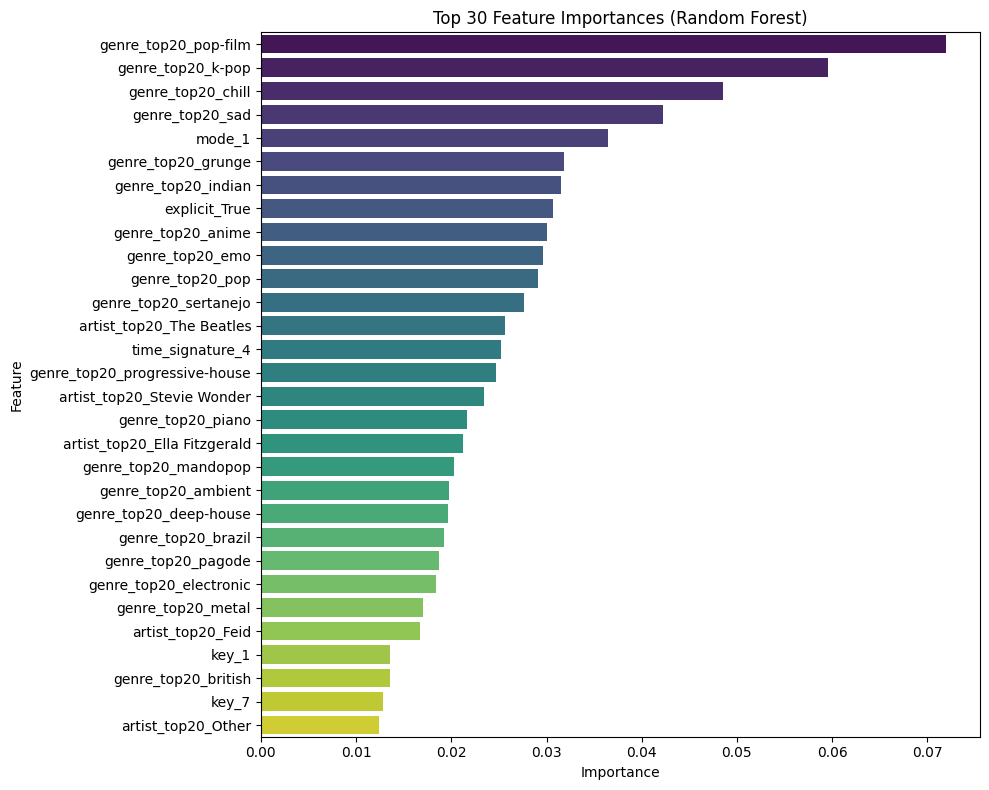

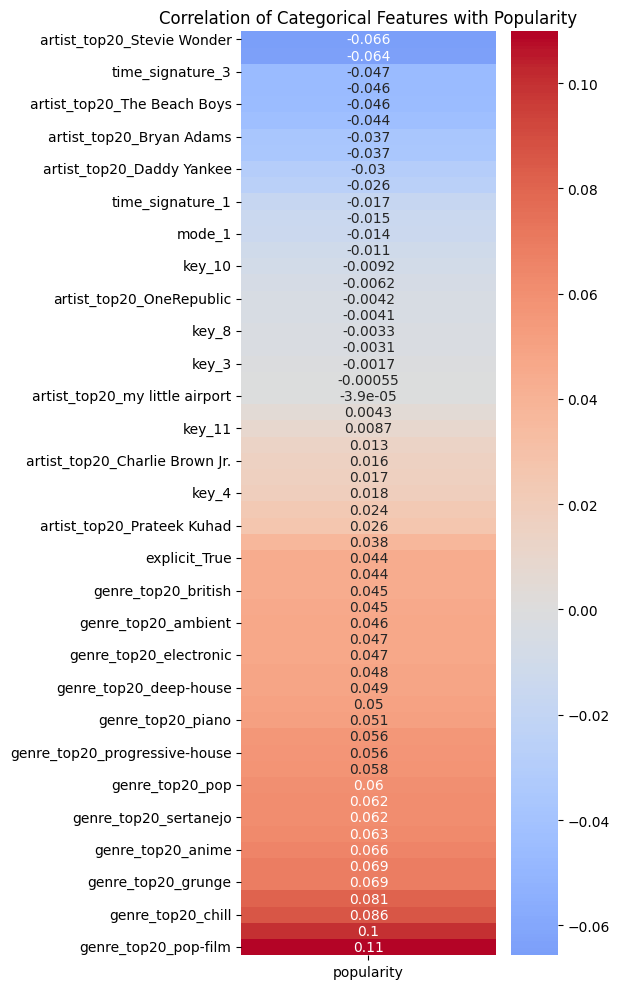

In [ ]:
# Selecting top 20 artists and genres
top_artists = df['artists'].value_counts().nlargest(20).index
genre_popularity = df.groupby('track_genre')['popularity'].mean().sort_values(ascending=False)
top_genres = genre_popularity.head(20).index

# Creating categorical columns with 'Other' for less common artists/genres
df['artist_top20'] = df['artists'].where(df['artists'].isin(top_artists), other='Other')
df['genre_top20'] = df['track_genre'].where(df['track_genre'].isin(top_genres), other='Other')

# Selecting all relevant categorical features
features_cat = ['artist_top20', 'genre_top20', 'explicit', 'mode', 'key', 'time_signature']
X_cat = df[features_cat]
y = df['popularity']

# One-hot encoding the categorical variables
encoder = OneHotEncoder(drop='first', handle_unknown='ignore')
X_encoded = encoder.fit_transform(X_cat)
feature_names = encoder.get_feature_names_out(features_cat)

# Converting the sparse matrix to a dense array before creating the DataFrame
X_enc_df = pd.DataFrame(X_encoded.toarray(), columns=feature_names, index=df.index)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_enc_df, y, test_size=0.2, random_state=42)

# Fitting a Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)

# Evaluating model
r2 = r2_score(y_test, y_pred)
print(f"Random Forest R² score: {r2:.4f}")

# Feature importances
importances = pd.Series(rf.feature_importances_, index=feature_names).sort_values(ascending=False)

# Plot top 30 feature importances
plt.figure(figsize=(10, 8))
sns.barplot(x=importances.head(30), y=importances.head(30).index, palette='viridis', hue=importances.head(30).index, legend=False)
plt.title("Top 30 Feature Importances (Random Forest)")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# Correlation matrix of encoded features and popularity
corr_matrix = pd.concat([X_enc_df, y], axis=1).corr().loc[feature_names, ['popularity']].sort_values('popularity')
plt.figure(figsize=(6, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation of Categorical Features with Popularity")
plt.tight_layout()
plt.show()


### **Model Performance**

- **R² = 0.138**
  - The model explains about **13.8% of the variance** in popularity.

---

#### **Most Important Features**

| Feature                        | Insight                                                                 |
|-------------------------------|-------------------------------------------------------------------------|
| `genre_top20_pop-film`        | Strongest predictor — consistently linked to higher popularity          |
| `genre_top20_k-pop`           | Highly predictive of popularity                                         |
| `genre_top20_chill` / `sad`   | Emotionally distinctive genres that contribute meaningfully             |
| `mode_1`                      | Songs in major mode tend to be slightly more popular                    |
| `explicit_True`               | Has a modest positive effect — likely genre-associated                  |
| `artist_top20_The Beatles`    | Associated with higher popularity                                       |
| `time_signature_4`            | Popular songs are frequently structured in common 4/4 time              |
---
Absolutely! Here's a **bullet point list** that explains the top features in your Random Forest model using **outside knowledge and real-world context** — perfect for your notebook or report:

---

### **Explanations of Top Features**

* **`genre_top20_pop-film`**

  * Songs from film soundtracks often benefit from **cross-media exposure** (e.g., featured in movies, trailers).
  * They're commonly used in **emotional scenes**, increasing their replayability and virality.

* **`genre_top20_k-pop`**

  * K-pop enjoys a **global fanbase**, especially active on streaming platforms.
  * Artists have **strong brand identities**, and engage fans with **social media campaigns**, boosting visibility.

* **`genre_top20_chill`**

  * Chill songs dominate **lo-fi, study, and relaxation playlists** — highly streamed for background listening.
  * Their **non-intrusive sound** makes them ideal for repeat listening, driving up popularity.

* **`genre_top20_sad`**

  * Sad music resonates emotionally with listeners and often features on **mood-based playlists** (e.g., “Sad Bops”).
  * These tracks can go viral on **TikTok** or other platforms due to **relatable lyrics** or trends.

* **`mode_1` (Major key)**

  * Major key songs are often perceived as **happier, more uplifting**, and **more commercially viable**.
  * Aligns with traditional pop formulas that appeal to broader audiences.

* **`genre_top20_grunge` / `emo` / `indian`**

  * Reflect **niche yet loyal listener groups** that may not be massive but have **consistent streaming behavior**.
  * Some may gain popularity due to **cultural revival**, **nostalgia**, or **algorithmic playlist placement**.

* **`explicit_True`**

  * Explicit songs are typical in **rap, hip-hop, and trap**, which dominate Spotify’s most-streamed lists.
  * Youth demographics often prefer edgier or less censored music.

* **`artist_top20_The Beatles`**

  * Iconic legacy artists often have enduring popularity due to **cultural significance**, **educational exposure**, and **playlist curation**.

* **`time_signature_4`**

  * 4/4 is the **default time signature** in pop, dance, and rock — easy to dance to and **familiar to listeners**.






# **Random Forest Regression on Continous Variables**

**Goal: To determine if there are any non-linear relationships between the audio features in the dataset and a song's popularity.**




Random Forest R-squared score (audio features): 0.5519


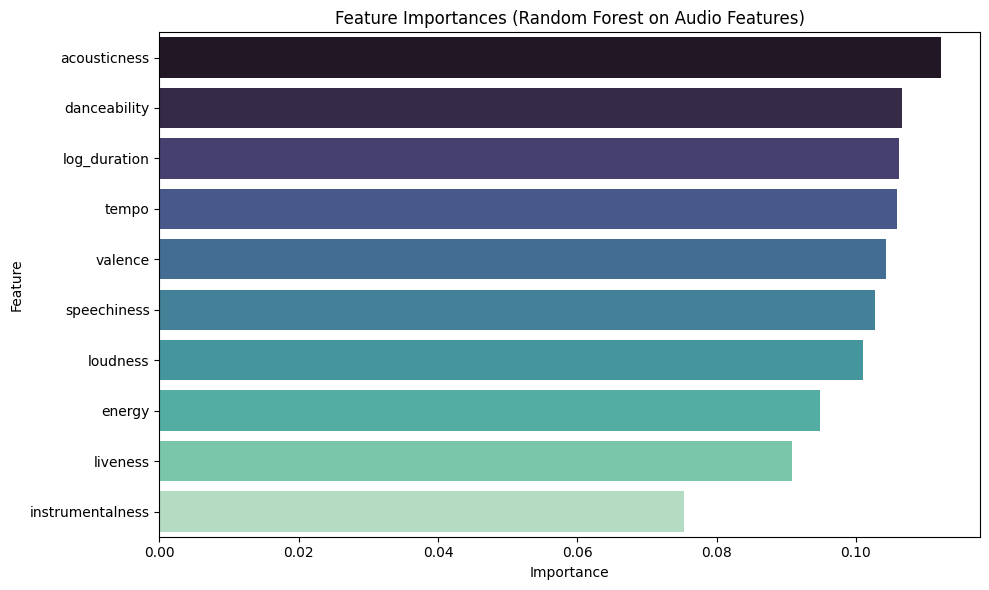

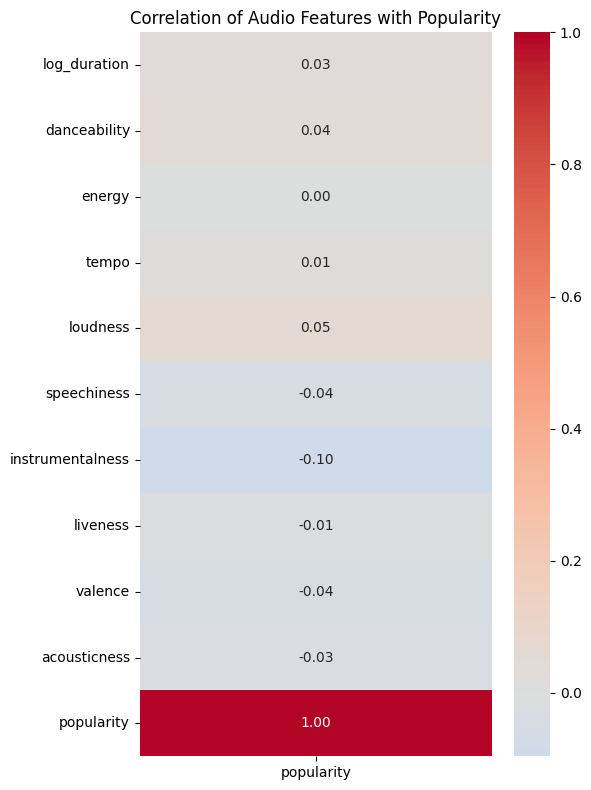

In [ ]:
# 1) Load & copy
df_clean = df.copy()

# 2) Define raw feature set & target, then split
raw_features = [
    'duration_ms', 'danceability', 'energy',
    'tempo', 'loudness', 'speechiness',
    'instrumentalness', 'liveness',
    'valence', 'acousticness'
]
X = df_clean[raw_features]
y = df_clean['popularity']

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.20, random_state=42
)

# 3) Simple transformation: log‑transform duration
for split in (X_train, X_test):
    split['log_duration'] = np.log10(split['duration_ms'] + 1)

# 4) Define final feature set (drop the raw duration_ms if desired)
feature_columns = [
    'log_duration', 'danceability', 'energy',
    'tempo', 'loudness', 'speechiness',
    'instrumentalness', 'liveness',
    'valence', 'acousticness'
]

X_train_final = X_train[feature_columns]
X_test_final  = X_test[feature_columns]

# 5) Train RandomForestRegressor
rf_audio = RandomForestRegressor(
    n_estimators=100,
    random_state=42,
    n_jobs=-1
)
rf_audio.fit(X_train_final, y_train)

# 6) Predict & evaluate
y_pred_audio = rf_audio.predict(X_test_final)
r2_audio = r2_score(y_test, y_pred_audio)
print(f"Random Forest R-squared score (audio features): {r2_audio:.4f}")

# 7) Feature importances
importances_audio = pd.Series(
    rf_audio.feature_importances_,
    index=feature_columns
).sort_values(ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(
    x=importances_audio.values,
    y=importances_audio.index,
    palette='mako',
    hue=importances_audio.index,
    orient='h'
)
plt.title("Feature Importances (Random Forest on Audio Features)")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

# 8) Correlation of features with popularity
corr_df = pd.concat([X_train_final, y_train.rename('popularity')], axis=1)
corr_matrix_audio = corr_df.corr().loc[feature_columns + ['popularity'], ['popularity']]

plt.figure(figsize=(6, 8))
sns.heatmap(
    corr_matrix_audio,
    annot=True,
    cmap='coolwarm',
    center=0,
    fmt=".2f"
)
plt.title("Correlation of Audio Features with Popularity")
plt.tight_layout()
plt.show()


### **Model Performance**

* **R² = 0.5519**
    Approximately 55.19 % of the variance in song popularity is explained by the audio features in the Random Forest model.

---

### **Feature Importances**

> *Importance values are approximate, estimated from the plotted Feature Importances chart.*

| Rank | Feature            | Approx. Importance | Notes                                                                        |
| ---- | ------------------ | ------------------ | ---------------------------------------------------------------------------- |
| 1    | `acousticness`     | \~ 0.11            | Top predictor—often distinguishes acoustic/folk tracks from electronic ones. |
| 2    | `danceability`     | \~ 0.11            | Closely tied to user engagement and streaming behavior.                      |
| 3    | `log_duration`     | \~ 0.11            | Log‑transform stabilizes extreme track lengths and captures song structure.  |
| 4    | `tempo`            | \~ 0.11            | Detects the energy level and pacing that drive listener retention.           |
| 5    | `valence`          | \~ 0.11            | Positive‑sounding songs tend to chart better in pop and EDM playlists.       |
| 6    | `speechiness`      | \~ 0.10            | Indicates presence of vocals or spoken word, useful for genre cues.          |
| 7    | `loudness`         | \~ 0.10            | Reflects production intensity—louder mixes often correlate with hits.        |
| 8    | `energy`           | \~ 0.09            | Captures overall intensity; high‑energy tracks often perform well.           |
| 9    | `liveness`         | \~ 0.09            | Live‑feel may influence listener perception and replay likelihood.           |
| 10   | `instrumentalness` | \~ 0.08            | Differentiates vocals‑driven from instrumental tracks.                       |

---

### **Takeaways**

> Although the correlation matrix shows very weak linear relationships between individual audio features and popularity, the Random Forest model uncovers complex non‑linear patterns that explain over half of the variance in track popularity




# **Chi-Squared Test**

**Goal: To investigate if there is an association between a song's explicit content and its likelihood of being among the top 25% most popular songs.**

**Null Hypothesis (H₀):** There is no association between a song's explicit content and its likelihood of being among the top 25% most popular songs.

**Alternative Hypothesis (H₁):** There is an association between a song's explicit content and its likelihood of being among the top 25% most popular songs.

In the context of this test, popular is True if popularity is > 75 Percentile threshold, False otherwise

In [ ]:
# Calculate the 75th percentile of popularity
popularity_threshold = df['popularity'].quantile(0.75)

# Creating a new column 'popular' based on the 75th percentile
# 'popular' will be True if popularity is > threshold (above), False otherwise
df['popular'] = df['popularity'] > popularity_threshold

# Create the contingency table
# Table will now compare 'explicit' (True/False) with 'popular' (True/False)
contingency = pd.crosstab(df['explicit'], df['popular'])

print("Raw Contingency Table (Explicit vs. Popularity > 75th Percentile):")
# Display the raw table without print()
display(contingency)
print("-" * 30) # Separator line

# Calculate and display row percentages
contingency_row_percent = contingency.apply(lambda r: r/r.sum(), axis=1)
print("Contingency Table (Row Percentages):")
display(contingency_row_percent.round(4) * 100) # Display as percentage, rounded to 2 decimal places
print("-" * 30) # Separator line

# Calculate and display column percentages
contingency_col_percent = contingency.apply(lambda c: c/c.sum(), axis=0)
print("Contingency Table (Column Percentages):")
display(contingency_col_percent.round(4) * 100) # Display as percentage, rounded to 2 decimal places
print("-" * 30) # Separator line

# Calculate and display total percentages
contingency_total_percent = contingency / contingency.sum().sum()
print("Contingency Table (Total Percentages):")
display(contingency_total_percent.round(4) * 100) # Display as percentage, rounded to 2 decimal places
print("-" * 30) # Separator line

# Perform and print the Chi-Squared test results
# This is now valid as we have a 2x2 table comparing two binary variables
chi2, p, dof, expected = chi2_contingency(contingency)
print(f"Chi² = {chi2:.2f}, p-value = {p:.4f}")
print("Interpretation: A low p-value (typically < 0.05) indicates a statistically significant association between explicit content and being in the top 75th percentile of popularity.")

Raw Contingency Table (Explicit vs. Popularity > 75th Percentile):


popular,False,True
explicit,,
False,79650,24603
True,6580,3167


------------------------------
Contingency Table (Row Percentages):


popular,False,True
explicit,,
False,76.40,23.60
True,67.51,32.49


------------------------------
Contingency Table (Column Percentages):


popular,False,True
explicit,,
False,92.37,88.6
True,7.63,11.4


------------------------------
Contingency Table (Total Percentages):


popular,False,True
explicit,,
False,69.87,21.58
True,5.77,2.78


------------------------------
Chi² = 382.08, p-value = 0.0000
Interpretation: A low p-value (typically < 0.05) indicates a statistically significant association between explicit content and being in the top 75th percentile of popularity.


### **Analysis**
Chi² = 382.08: There’s a very large deviation from what you’d expect if explicit and popularity were unrelated.

p-value < 0.0001: This result is highly statistically significant.

**We have strong evidence to reject the null hypothesis. So it can concluded there is a statistically significant association between a song's explicit content and its likelihood of being among the top 25% most popular songs.**

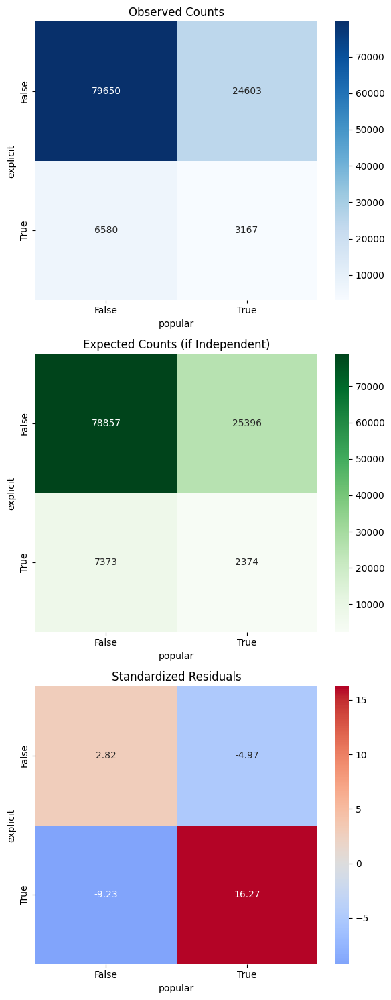

popular,False,True
explicit,,
False,2.822725,-4.974047
True,-9.231610,16.267420


In [ ]:
# Format expected frequencies as DataFrame
expected_df = pd.DataFrame(expected, index=contingency.index, columns=contingency.columns)
expected_df

# Observed vs. Expected difference
observed_df = contingency
difference_df = observed_df - expected_df

# Standardized residuals
std_residuals = (observed_df - expected_df) / np.sqrt(expected_df)

# Plot: Observed vs. Expected
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(6, 15))

# Observed
sns.heatmap(observed_df, annot=True, fmt=".0f", cmap="Blues", ax=axes[0])
axes[0].set_title("Observed Counts")

# Expected
sns.heatmap(expected_df, annot=True, fmt=".0f", cmap="Greens", ax=axes[1])
axes[1].set_title("Expected Counts (if Independent)")

# Residuals
sns.heatmap(std_residuals, annot=True, fmt=".2f", cmap="coolwarm", center=0, ax=axes[2])
axes[2].set_title("Standardized Residuals")

plt.tight_layout()
plt.show()

# Return residuals for reference
std_residuals

### **Observed vs. Expected vs. Residuals**

#### **Standardized Residuals Table**

| `explicit` | Not Popular (`False`) | Popular (`True`) |
| ---------- | --------------------- | ---------------- |
| **False**  | +2.82                 | **–4.87**        |
| **True**   | **–9.23**             | **+16.27**       |

---


#### Standardized Residuals:

* **Residual > +2** or < –2 → significantly different from expectation.
* **Positive residual** → more observed than expected.
* **Negative residual** → fewer observed than expected.

---

### Key Findings:

* **Explicit songs are much more likely to be popular than expected** (residual = +16.0).
* **Non-explicit songs are underrepresented among popular tracks** (residual = –4.87).
* These deviations are **far beyond chance** — confirming the Chi² result.

---

> There is a **strong, statistically significant association** between explicit content and song popularity. Explicit songs are **overrepresented** among the most popular tracks — possibly reflecting the dominance of genres like **hip-hop, rap, and pop** that frequently include explicit content.



# **Predicting Broad Song Genres with a Random Forest Classifier**

**Goal:Leverages audio features (e.g., tempo, energy, valence) to try to predict each track’s broad genre  as accurately as possible.**

**Null Hypothesis (H₀):** The model’s features have no predictive association with a track’s broad genre; classification accuracy will be no better than a random baseline.

**Alternative Hypothesis (H₁):** The chosen features are predictive of genre, meaning that the classifier is able to predict a song's genre with an accuracy greater than random chance.

**Why Random Forest Classifier?**

**Resilience to Outliers**: Its decision-making process is based on the relative order of values rather than their precise magnitudes. Consequently, extreme outlier values are handled effectively without distorting the thresholds used for classification or regression.

**Robust Ensemble Averaging**: The model combines predictions from numerous individual decision trees. This ensemble approach ensures that any single anomalous data point influences only a small portion of these trees, and its impact is minimized through the averaging process in the final output.

**Effective Handling of High-Dimensional Data**: Random Forests can manage a large number of input features (e.g., diverse audio characteristics) without succumbing to overfitting. This is achieved because each decision point within a tree considers only a random subset of the available features.

**Adaptability to Complex Data Distributions**: It does not rely on assumptions about the statistical distribution of the input data. This flexibility allows it to effectively model complex, real-world datasets, such as those with skewed or multimodal distributions often found in audio data.


Training set: (85500, 14), Testing set: (28500, 14)
Genres: ['Ambient/Instrumental' 'Classical/Opera' 'Country/Folk' 'Drum & Bass'
 'Dubstep' 'Electronic' 'Hip-Hop/Rap' 'House' 'Jazz & Blues'
 'Kids/Children' 'Latin' 'Metal' 'Other_Broad_Genre' 'Pop' 'Punk'
 'R&B/Soul & Funk' 'Reggae/Ska' 'Rock' 'Techno' 'Theme/Miscellaneous'
 'World/Regional']
Accuracy: 0.4386

Classification Report:
                      precision    recall  f1-score   support

Ambient/Instrumental       0.59      0.62      0.61      1750
     Classical/Opera       0.48      0.45      0.46       750
        Country/Folk       0.57      0.62      0.59      1250
         Drum & Bass       0.70      0.57      0.63       250
             Dubstep       0.14      0.13      0.14       250
          Electronic       0.40      0.49      0.44      4250
         Hip-Hop/Rap       0.28      0.34      0.31       250
               House       0.29      0.32      0.31       750
        Jazz & Blues       0.45      0.38      0.41  

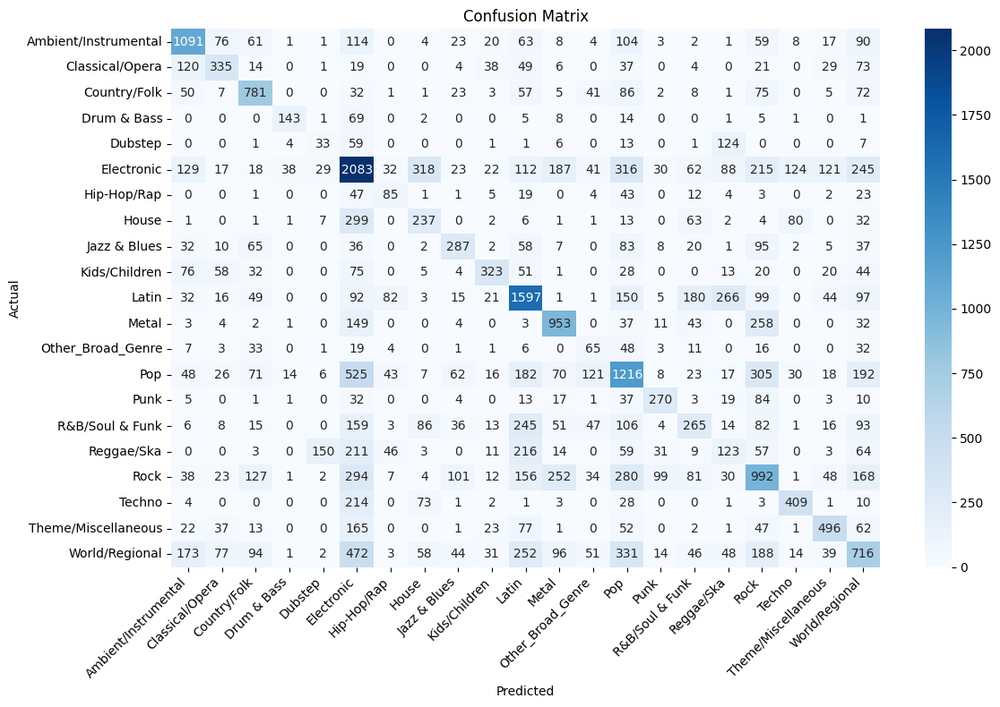

In [ ]:
# 1. Genre mapping (same as before)
genre_mapping = {
    # 1. Rock
    **{g: 'Rock' for g in [
        'alt-rock','alternative','emo','grunge','hard-rock',
        'j-rock','psych-rock','rock','rock-n-roll','rockabilly','goth'
    ]},
    # 2. Metal
    **{g: 'Metal' for g in [
        'black-metal','death-metal','heavy-metal','metal','metalcore','grindcore'
    ]},
    # 3. Punk
    **{g: 'Punk' for g in ['punk','punk-rock']},
    # 4. Pop
    **{g: 'Pop' for g in [
        'pop','pop-film','power-pop','synth-pop','indie-pop','k-pop',
        'anime','j-idol','j-pop','cantopop','mandopop','happy'
    ]},
    # 5. Hip‑Hop/Rap
    'hip-hop':'Hip-Hop/Rap',
    # 6. R&B/Soul & Funk
    **{g: 'R&B/Soul & Funk' for g in ['r-n-b','soul','gospel','funk','groove']},
    # 7. Jazz & Blues
    **{g: 'Jazz & Blues' for g in ['jazz','blues','bluegrass']},
    # 8. Country/Folk
    **{g: 'Country/Folk' for g in [
        'country','honky-tonk','folk','singer-songwriter','songwriter'
    ]},
    # 9. Classical/Opera
    **{g: 'Classical/Opera' for g in ['classical','opera','show-tunes']},
    #10. Ambient/Instrumental
    **{g: 'Ambient/Instrumental' for g in [
        'ambient','acoustic','guitar','new-age','piano','sleep','study'
    ]},
    #11. Electronic (General)
    **{g: 'Electronic' for g in [
        'electronic','edm','electro','club','breakbeat','garage','idm',
        'trip-hop','trance','hardstyle','progressive-house','disco','dance',
        'j-dance','industrial','chill','hardcore'
    ]},
    #12. House
    **{g: 'House' for g in ['house','deep-house','chicago-house']},
    #13. Techno
    **{g: 'Techno' for g in ['techno','detroit-techno','minimal-techno']},
    #14. Drum & Bass
    'drum-and-bass':'Drum & Bass',
    #15. Dubstep
    'dubstep':'Dubstep',
    #16. Latin
    **{g: 'Latin' for g in [
        'latin','latino','salsa','samba','tango','brazil','forro','mpb',
        'pagode','sertanejo','reggaeton'
    ]},
    #17. Reggae/Ska
    **{g: 'Reggae/Ska' for g in ['reggae','ska','dancehall','dub']},
    #18. World/Regional
    **{g: 'World/Regional' for g in [
        'world-music','afrobeat','french','german','swedish','indian','iranian',
        'turkish','malay','british','spanish'
    ]},
    #19. Kids/Children
    **{g: 'Kids/Children' for g in ['children','kids','disney']},
    #20. Theme/Miscellaneous
    **{g: 'Theme/Miscellaneous' for g in ['comedy','party','romance','sad']}
}

# 2. Build df_clean and map genres
df_clean = df.copy()
df_clean['broad_genre'] = (
    df_clean['track_genre']
      .map(genre_mapping)
      .fillna('Other_Broad_Genre')
)

# 3. Simple feature engineering
df_clean['explicit_int'] = df_clean['explicit'].astype(int)

# Keep raw duration (you can still log-transform for skew)
df_clean['log_duration'] = np.log10(df_clean['duration_ms'] + 1)

# 4. Fill missing values (median imputation)
for col in [
    'danceability', 'energy', 'valence', 'acousticness',
    'mode', 'key', 'time_signature', 'tempo',
    'loudness', 'speechiness', 'instrumentalness', 'liveness'
]:
    if col in df_clean.columns:
        df_clean[col] = df_clean[col].fillna(df_clean[col].median())

# 5. Define features & target
feature_columns = [
    'log_duration', 'danceability', 'energy',
    'instrumentalness', 'liveness', 'tempo',
    'loudness', 'valence', 'speechiness',
    'acousticness', 'explicit_int', 'mode',
    'key', 'time_signature'
]

X = df_clean[feature_columns]
y_raw = df_clean['broad_genre']

# 6. Encode target
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y_raw)

# 7. Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.25,
    random_state=42,
    stratify=y
)

print(f"Training set: {X_train.shape}, Testing set: {X_test.shape}")
print(f"Genres: {label_encoder.classes_}")

# 8. Train RandomForestClassifier
model = RandomForestClassifier(
    n_estimators=100,
    random_state=42,
    n_jobs=-1,
    class_weight='balanced'
)
model.fit(X_train, y_train)

# 9. Evaluate
y_pred = model.predict(X_test)
print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")

print("\nClassification Report:")
print(classification_report(
    y_test, y_pred,
    target_names=label_encoder.classes_,
    zero_division=0
))

# 10. Feature importances
importances = model.feature_importances_
fi = pd.DataFrame({
    'feature': feature_columns,
    'importance': importances
}).sort_values('importance', ascending=False)

print("\nTop 10 Feature Importances:")
print(fi.head(10))

# 11. Confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(12, 8))
sns.heatmap(
    cm, annot=True, fmt='d', cmap='Blues',
    xticklabels=label_encoder.classes_,
    yticklabels=label_encoder.classes_
)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### **Analysis of Genre Prediction Model**

---

#### Model Details

| Setting               | Description               |
| --------------------- | ------------------------- |
| **Features**          | 14 audio features         |
| **Categories**        | 20 broad genre categories |
| **Random baseline**   | (1 / 20) × 100 % ≈ 5 %    |
| **Achieved accuracy** | \~ 43.86 %                |

---

#### **Overall Model Accuracy**

The model achieved an accuracy of approximately **43.86 %**, meaning it correctly predicted the broad genre for about **2 out of every 5** songs, So we can reject the null hypothesis.

For a **20‑class** classification problem, the expected accuracy by random chance is **(1 / 20) × 100 % ≈ 5 %**, indicating that the model has learned meaningful patterns from the audio features to distinguish between these genres.

---

#### Performance on Individual Genre Categories

##### Strong Performers (F1‑score > 0.60)

| Genre                    | F1‑score |
| ------------------------ | -------- |
| **Drum & Bass**          | \~ 0.63  |
| **Ambient/Instrumental** | \~ 0.61  |
| **Metal**                | \~ 0.60  |

Drum & Bass and Ambient/Instrumental lead the pack, reflecting its highly distinctive profile of audio features.

---

##### Moderate Performers (F1‑score roughly 0.45 – 0.59)

* Country/Folk
* Classical/Opera
* Kids/Children
* Latin
* Punk
* Techno
* Theme/Miscellaneous

These genres show reasonable classification ability. Their audio features—like characteristic instrumentation or rhythmic patterns—are sufficiently coherent for the model to capture a majority of true instances.

---

##### Major Genres with Difficulty

* **Hip‑Hop/Rap:** F1 ≈ 0.31
* **Pop:** F1 ≈ 0.40

High‑visibility categories such as Hip‑Hop/Rap and Pop overlap acoustically with other styles, leading to lower precision and recall.

---

##### Specific Regional/Niche Genres

Substyles like **Dubstep** (F1 ≈ 0.14), **Reggae/Ska** (≈ 0.14), and **World/Regional** (≈ 0.30) perform poorly. The current feature set struggles to capture the nuanced rhythmic and cultural elements that define these genres.

---

##### Other\_Broad\_Genre

As expected, this catch‑all bucket for unmapped or miscellaneous genres underperforms (F1 ≈ 0.20), since it contains highly heterogeneous tracks.

---

#### Key Takeaways

* **Distinct vs. Overlapping Genres:**
  Categories with unique sonic fingerprints (e.g., Drum & Bass, Ambient/Instrumental, Metal) are reliably identified. In contrast, genres sharing common production elements (Pop, Hip‑Hop/Rap) are frequently conflated.

* **Recall Challenges for Specificity:**
  Low‑support and mood‑based categories (Dubstep, Reggae/Ska, Other\_Broad\_Genre) exhibit low recall, indicating many true examples are misclassified into more dominant genre buckets.

